#### Importing Libraries

In [53]:
import warnings
warnings.filterwarnings("ignore")
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import resample
from sklearn.metrics import confusion_matrix
import math
import joblib
from sklearn.metrics import mean_squared_error, mean_pinball_loss, r2_score, classification_report, confusion_matrix, mean_absolute_percentage_error
from imblearn.over_sampling import SMOTENC
import lightgbm as lgb


#### Constants

In [54]:
PATH_TO_CVS = 'output/output-energy/'
# This constant contains the unique quantile to represent in the scatter plot of residuals 
ONLY_QUANTILE = 0.95
# A selection of node metrics to represent in the boxplot and in the scatter plot 
COL_TO_PLOT = ['cpu_usage_idle_node', 'cpu_usage_node', 'ram_usage_idle_node', 'ram_usage_node', 'power_usage_idle_node', 'power_usage_node']
# List containing the values whose quantile regression is to be calculated
QUANTILES = [0.05, 0.95]
NODE_TYPES = ["LIGHT", "MID", "HEAVY"]

#### Utilities functions

In [55]:
# Function used to fill NaN values within the dataframe X
def fill_NaN(X):
  for col in X:
    if(col.startswith('success_rate_')):
      X.loc[:, col] = X.loc[:, col].fillna(1)
    else:
      X.loc[:, col] = X.loc[:, col].fillna(0)
  return X

In [56]:
# Function to reweight of dataframe
def resample_dataset(X, y):
  X_resampled, y_resampled = resample(X, y, replace=True, random_state=42)
  return X_resampled, y_resampled

In [57]:
# Function used to split the dataset into training and test set
def split_dataset(X, y):
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
  print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)
  return X_train, X_test, y_train, y_test

In [58]:
def convert_dataset(X_train, X_test, y_train, y_test):
  X_train_nn = X_train.astype(np.float32)
  X_test_nn = X_test.astype(np.float32)
  y_train_nn = y_train.astype(np.float32)
  y_test_nn = y_test.astype(np.float32)
  
  return X_train_nn, X_test_nn, y_train_nn, y_test_nn

In [59]:
# Function used to calculate the weighted mean squared error
def wmse_score(y_true, y_pred):
  # Calculates the weight of classes for the first target  
  median_cpu = y_true['cpu_usage_node'].median()
  w_majority_cpu = y_true[y_true['cpu_usage_node'] <= median_cpu].shape[0] / y_true.shape[0]
  w_minority_cpu = y_true[y_true['cpu_usage_node'] > median_cpu].shape[0] / y_true.shape[0]

  # Calculate the weight of classes for the second target
  median_ram = y_true['ram_usage_node'].median()
  w_majority_ram = y_true[y_true['ram_usage_node'] <= median_ram].shape[0] / y_true.shape[0]
  w_minority_ram = y_true[y_true['ram_usage_node'] > median_ram].shape[0] / y_true.shape[0]

  # Calculates the MSE for both targets
  mse_cpu = mean_squared_error(y_true['cpu_usage_node'], y_pred['cpu_usage_node'])
  mse_ram = mean_squared_error(y_true['ram_usage_node'], y_pred['ram_usage_node'])

  # Calculates WMSE as a weighted average of the MSEs for the two targets
  wmse = (w_majority_cpu * mse_cpu * y_true.shape[0] / (w_majority_cpu * y_true[y_true['cpu_usage_node'] <= median_cpu].shape[0] + w_minority_cpu * y_true[y_true['cpu_usage_node'] > median_cpu].shape[0]) +
          w_majority_ram * mse_ram * y_true.shape[0] / (w_majority_ram * y_true[y_true['ram_usage_node'] <= median_ram].shape[0] + w_minority_ram * y_true[y_true['ram_usage_node'] > median_ram].shape[0])) / 2

  return wmse

In [76]:
# Function used to calculate metrics based on the task
def metrics(task_type, y_test, y_pred, quantile):
  if(task_type == 'regression'):
    mape = mean_absolute_percentage_error(y_test, y_pred)
    print("mape:", mape)
    mse = mean_squared_error(y_test, y_pred)
    print("mse:", mse)
    rmse = math.sqrt(mse)
    print("rmse:", rmse)
    r2 = r2_score(y_test, y_pred)
    print("R-squared score:", r2)
    std_dev = float(np.std(y_pred))
    print("Standard deviation:", std_dev)
    if quantile != 0:
      quantile_loss = mean_pinball_loss(y_test, y_pred, alpha=quantile)
      print("Quantile loss with library: ", quantile_loss)
    else:
      quantile_loss = "Not calculated for this target"
    return {"mape": mape, "mse": mse, "rmse": rmse, "r2": r2, "quantile_loss": quantile_loss, "std_dev": std_dev}    
  elif(task_type.endswith('classification')):
    report = classification_report(y_test, y_pred)
    print("Classification Report:\n", report)
    return {}

In [61]:
# Function used to plot the regression lines for the 2 targets
def plot_regression(y_test, y_pred, target_name):
  # Calculate the regression lines
  m, q = np.polyfit(y_test.ravel(), y_pred.ravel(), 1)

  # Plot the regression lines
  plt.plot(y_test, y_pred, 'o', color='red', fillstyle='none')
  plt.plot(y_test, m*y_test + q, linestyle='--')
  plt.xlabel('Valori osservati')
  plt.ylabel('Valori predetti')
  plt.title('Regressione di ' + target_name)
  plt.xlim(0, 1) 
  plt.ylim(0, 1)  
  plt.show()

  # Calculate residuals 
  residuals = y_test.flatten() - y_pred.flatten()

  # Scatter plot with regression line
  sns.scatterplot(x=y_test.flatten(), y=residuals, label=f'Osservazioni')

  # Add the horizontal line near the value 0.0 of the y-axis
  plt.axhline(y=0, color='black', linestyle='--', linewidth=1)
  plt.xlabel('Valori osservati')
  plt.ylabel('Residui (Valori osservati - Valori predetti)')
  plt.title(f'Regressione Standard - {target_name}')
  plt.legend()
  plt.show()

In [62]:
# Function used to plots quantile regression results.
def plot_quantile_regression(y_test, y_pred, target_name):    
    point = 1
    line = 3
    for col in y_pred:
        m, q = np.polyfit(y_test.ravel(), y_pred[col], 1)
        plt.plot(y_test, y_pred[col], 'o', fillstyle='none', label=f'Osservazioni - {col}')
        plt.plot(y_test, m*y_test + q, linestyle='--', zorder = line)
        point = point + 1
        line = line + 1
    plt.xlabel('Valori osservati')
    plt.ylabel('Valori predetti')
    plt.title('Regressione Quantile di ' + target_name)
    plt.xlim(0, 1)  
    plt.ylim(0, 1)  
    plt.legend()
    plt.show()

    # Calculate quantile residuals
    residuals = y_test.flatten() - y_pred[str(ONLY_QUANTILE)]

    # Scatter plot with regression line
    sns.scatterplot(x=y_test.flatten(), y=residuals, label=f'Osservazioni')

    # Add the horizontal line near the value 0.0 of the y-axis
    plt.axhline(y=0, color='black', linestyle='--', linewidth=1)
    plt.xlabel('Valori osservati')
    plt.ylabel('Residui quantili (Valori osservati - Valori predetti)')
    plt.title(f'Regressione Quantile {ONLY_QUANTILE} - {target_name}')
    plt.legend()
    plt.show()

In [63]:
# Function used to plot the confusion matrix
def plot_confusion_matrix(y_test, y_pred, target):
  # Calculate the confusion matrix
  cm = confusion_matrix(y_test[target], y_pred[target])

  # Plot the confusion matrix as heatmap
  sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
  plt.xlabel('Valori osservati')
  plt.ylabel('Valori predetti')
  plt.title('Confusion matrix')
  plt.show()

In [64]:
# Function used to train the desired model for a target variable
def train_model(target_name, X_train, y_train, quantile):
    # Classification task. Create model with autogluon
    if target_name.startswith('overloaded') or target_name.startswith('replica'):
        model_type = ""
        model = lgb.LGBMClassifier()
    # Quantile regression with LGBM
    elif quantile != 0:
        model = lgb.LGBMRegressor(objective='quantile', alpha=quantile)
        model_type = "quantile" + str(quantile).replace('.', '')
    # Regression with LGBM
    else:
        model = lgb.LGBMRegressor(objective='regression')
        model_type = "regression"
    
    model.fit(X_train, y_train)
    path = './system-forecaster-models/functions/' + target_name + "/" + model_type
    if not os.path.exists(path):
        os.makedirs(path)
    joblib.dump(model, path + "/model.joblib")
    return model



In [65]:
# Function to obtain a barchart of the type of nodes
def plot_node_type_distribution(df):
    """
    Visualizza il numero di dati per ogni tipologia di nodo in un DataFrame tramite un bar chart.

    :param df: DataFrame contenente la colonna 'node_type' con le tipologie di nodo.
    """
    # Count of occurrences for each node type
    node_counts = df['node_type'].value_counts()

    # Bar chart
    plt.figure(figsize=(10, 6))
    node_counts.plot(kind='bar')
    plt.title('Distribuzione del Numero di Dati per Tipologia di Nodo')
    plt.xlabel('Tipologia di Nodo (0 = Heavy, 1 = Mid, 2 = Light)')
    plt.ylabel('Numero di Righe')
    plt.xticks(rotation=0)  # Maintains names of horizontal node types
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.show()

In [66]:
# Function to obtain a barchart of overloaded node distribution
def plot_overloaded_node_distribution(df):
    """
    Visualizza il numero di righe in cui 'overloaded_node' è 1 e quelle in cui è 0.

    :param df: DataFrame contenente la colonna 'overloaded_node'.
    """
    # Count of occurrences of 0 and 1 in the 'overloaded_node' column
    overloaded_counts = df['overloaded_node'].value_counts()

    # Bar chart
    plt.figure(figsize=(8, 5))
    overloaded_counts.plot(kind='bar')
    plt.title('Distribuzione di Nodi Sovraccaricati')
    plt.xlabel('Stato Sovraccarico (0 = No, 1 = Sì)')
    plt.ylabel('Numero di Righe')
    plt.xticks(rotation=0)  
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.show()

#### Retrieving dataset

In [67]:
df = pd.DataFrame()
for node_type in NODE_TYPES:
    # Retrieve all files in the output folder
    file_csv = [file for file in os.listdir(PATH_TO_CVS + node_type) if file.endswith('.csv')]
    # Create the dataframe by concatenating all read files
    dataframes = []
    for file in file_csv:
        file_path = os.path.join(PATH_TO_CVS + node_type, file)
        df_temp = pd.read_csv(file_path)    
        # Remove the columns in the dataframe that begin with "function_"
        df_temp.drop(columns=[col for col in df_temp if col.startswith('function_')], inplace=True)        
        # Aggiungi la colonna "node_type" e assegna il valore di 'type' a tutte le righe
        if node_type == "HEAVY":
            df_temp["node_type"] = 0
        elif node_type == "MID":
            df_temp["node_type"] = 1
        else: 
            df_temp["node_type"] = 2
        
        dataframes.append(df_temp)
        
    df = pd.concat([df, *dataframes], axis=0, ignore_index=True)

df = fill_NaN(df)

functions = [col[14:] for col in df if col.startswith('rate')]

for function in functions:
    df.loc[df['rate_function_' + function] == 0, ['cpu_usage_function_' + function, 'ram_usage_function_' + function, 'power_usage_function_' + function, 'replica_' + function]] = 0

In [68]:
df

,rate_function_shasum,success_rate_function_shasum,cpu_usage_function_shasum,ram_usage_function_shasum,power_usage_function_shasum,replica_shasum,overloaded_function_shasum,medium_latency_function_shasum,rate_function_curl,success_rate_function_curl,...,overloaded_function_env,medium_latency_function_env,rate_function_figlet,success_rate_function_figlet,cpu_usage_function_figlet,ram_usage_function_figlet,power_usage_function_figlet,replica_figlet,overloaded_function_figlet,medium_latency_function_figlet
0,100.0,1.0,7.691,4042069.333,11739.653,2.0,0.0,107580927.0,60.0,1.0,...,0.0,0.0,0.0,1.0,0.000,0.000000e+00,0.000,0.0,0.0,0.0
1,100.0,1.0,7.751,9199274.667,16427.020,1.0,0.0,16880204.0,60.0,1.0,...,0.0,0.0,0.0,1.0,0.000,0.000000e+00,0.000,0.0,0.0,0.0
2,100.0,1.0,8.378,9214634.667,14245.149,2.0,0.0,35575151.0,60.0,1.0,...,0.0,0.0,0.0,1.0,0.000,0.000000e+00,0.000,0.0,0.0,0.0
3,100.0,1.0,8.793,1366357.333,24734.177,2.0,0.0,76360433.0,60.0,1.0,...,0.0,0.0,0.0,1.0,0.000,0.000000e+00,0.000,0.0,0.0,0.0
4,100.0,1.0,7.820,1323008.000,17732.391,2.0,0.0,87032021.0,60.0,1.0,...,0.0,0.0,0.0,1.0,0.000,0.000000e+00,0.000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98779,0.0,1.0,0.000,0.000,0.000,0.0,0.0,0.0,0.0,1.0,...,0.0,13967111.0,70.0,1.0,10.414,1.344819e+07,27201.168,1.0,0.0,16680711.0
98780,0.0,1.0,0.000,0.000,0.000,0.0,0.0,0.0,0.0,1.0,...,0.0,12078762.0,70.0,1.0,10.012,1.713152e+06,27538.105,1.0,0.0,15961359.0
98781,0.0,1.0,0.000,0.000,0.000,0.0,0.0,0.0,0.0,1.0,...,0.0,12159595.0,70.0,1.0,8.494,1.336299e+07,25525.116,1.0,0.0,15225328.0
98782,0.0,1.0,0.000,0.000,0.000,0.0,0.0,0.0,0.0,1.0,...,0.0,16766710.0,70.0,1.0,9.619,1.337362e+07,28618.911,1.0,0.0,38791520.0


In [20]:
df.to_csv(os.path.join(PATH_TO_CVS, "all_results.csv"), index = False)

In [26]:
df.columns

Index(['rate_function_shasum', 'success_rate_function_shasum',
       'cpu_usage_function_shasum', 'ram_usage_function_shasum',
       'power_usage_function_shasum', 'replica_shasum',
       'overloaded_function_shasum', 'medium_latency_function_shasum',
       'rate_function_curl', 'success_rate_function_curl',
       'cpu_usage_function_curl', 'ram_usage_function_curl',
       'power_usage_function_curl', 'replica_curl', 'overloaded_function_curl',
       'medium_latency_function_curl', 'rate_function_eat-memory',
       'success_rate_function_eat-memory', 'cpu_usage_function_eat-memory',
       'ram_usage_function_eat-memory', 'power_usage_function_eat-memory',
       'replica_eat-memory', 'overloaded_function_eat-memory',
       'medium_latency_function_eat-memory', 'cpu_usage_idle_node',
       'cpu_usage_node', 'ram_usage_idle_node', 'ram_usage_node',
       'ram_usage_idle_node_percentage', 'ram_usage_node_percentage',
       'power_usage_idle_node', 'power_usage_node', 'rest_se

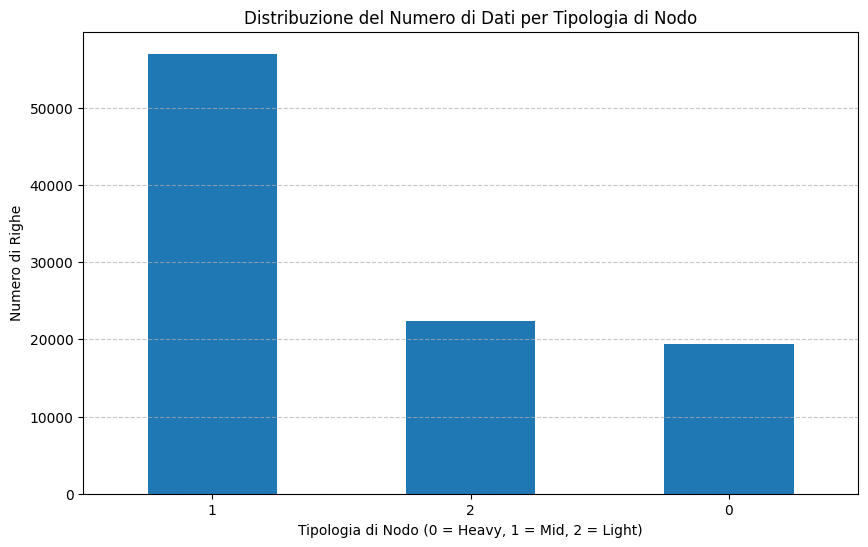

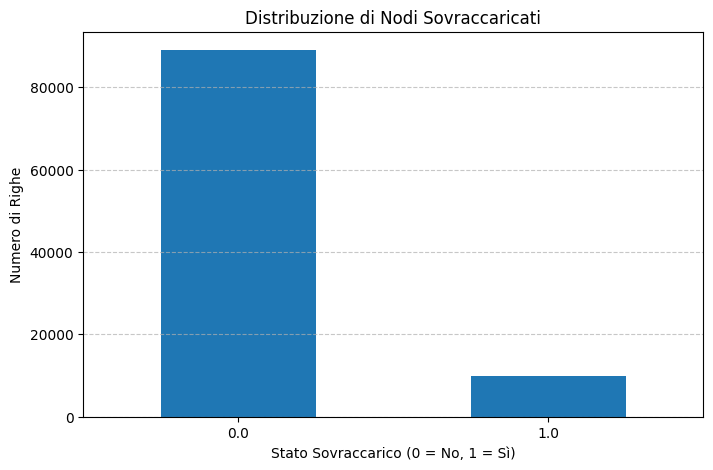

In [21]:
# Plot node type distribution
plot_node_type_distribution(df)
# Plot overloaded node distribution
plot_overloaded_node_distribution(df)

#### Removing outliers

In [69]:
# Iterate over each target column and handle outliers
functions_column = [col for col in df if col.startswith('rate')]
targets = [col for col in df if (col.startswith('power_usage_') or col.startswith('cpu_usage_') or col.startswith('ram_usage_') or col.startswith('overloaded_node') or col.startswith('medium_latency')) and 'idle' not in col]
grouped = df.groupby(functions_column + ['node_type'])
threshold = 1
for target in targets:
    print(target)
    if target != 'overloaded_node':
        mean = grouped[target].transform('mean')
        std = grouped[target].transform('std')
        outliers = (df[target] > mean + threshold * std) | (df[target] < mean - threshold * std)
        print(outliers.sum())
        df[target] = df[target].where(~outliers, mean)
    else:
        new_overloaded = grouped[target].transform('all')
        df['overloaded_node'] = new_overloaded.astype(int)
        print(df["overloaded_node"].value_counts())
df_only_useful = df[functions_column + targets + ["node_type"]]

cpu_usage_function_shasum
23887
ram_usage_function_shasum
23430
power_usage_function_shasum
23895
medium_latency_function_shasum
23610
cpu_usage_function_curl
14017
ram_usage_function_curl
13650
power_usage_function_curl
13997
medium_latency_function_curl
13920
cpu_usage_function_eat-memory
4571
ram_usage_function_eat-memory
4501
power_usage_function_eat-memory
4595
medium_latency_function_eat-memory
4564
cpu_usage_node
32752
ram_usage_node
32400
ram_usage_node_percentage
32140
power_usage_node
32498
overloaded_node
overloaded_node
0    90739
1     8045
Name: count, dtype: int64
cpu_usage_function_nmap
7319
ram_usage_function_nmap
7245
power_usage_function_nmap
7318
medium_latency_function_nmap
7301
cpu_usage_function_env
19397
ram_usage_function_env
18812
power_usage_function_env
19415
medium_latency_function_env
19202
cpu_usage_function_figlet
19900
ram_usage_function_figlet
19762
power_usage_function_figlet
19876
medium_latency_function_figlet
19790


In [28]:
df_only_useful.to_csv(
  os.path.join(PATH_TO_CVS, "all_results_no_outliers.csv"), index = False
)
df_only_useful

,rate_function_shasum,rate_function_curl,rate_function_eat-memory,rate_function_nmap,rate_function_env,rate_function_figlet,cpu_usage_function_shasum,ram_usage_function_shasum,power_usage_function_shasum,medium_latency_function_shasum,...,medium_latency_function_nmap,cpu_usage_function_env,ram_usage_function_env,power_usage_function_env,medium_latency_function_env,cpu_usage_function_figlet,ram_usage_function_figlet,power_usage_function_figlet,medium_latency_function_figlet,node_type
0,100.0,60.0,0.0,0.0,0.0,0.0,7.974469,1.221649e+07,13290.589094,3.745424e+07,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,2
1,100.0,60.0,0.0,0.0,0.0,0.0,7.974469,9.199275e+06,13542.554250,1.688020e+07,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,2
2,100.0,60.0,0.0,0.0,0.0,0.0,7.974469,9.214635e+06,14245.149000,3.557515e+07,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,2
3,100.0,60.0,10.0,0.0,0.0,0.0,8.261000,1.366357e+06,18796.556111,7.636043e+07,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,2
4,100.0,60.0,10.0,0.0,0.0,0.0,8.083667,1.323008e+06,17732.391000,7.935418e+07,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98779,0.0,0.0,0.0,70.0,20.0,70.0,0.000000,0.000000e+00,0.000000,0.000000e+00,...,1.655140e+10,2.024333,1.583218e+06,8393.166333,1.238607e+07,10.196000,2.994441e+06,27201.168000,1.611891e+07,0
98780,0.0,0.0,0.0,70.0,20.0,70.0,0.000000,0.000000e+00,0.000000,0.000000e+00,...,1.671265e+10,2.018111,1.553067e+06,8346.938000,1.207876e+07,10.123333,1.713152e+06,27538.105000,1.596136e+07,0
98781,0.0,0.0,0.0,70.0,30.0,70.0,0.000000,0.000000e+00,0.000000,0.000000e+00,...,1.728170e+10,2.889333,1.520640e+06,13030.786222,1.444850e+07,9.990167,7.250379e+06,28735.254833,1.522533e+07,0
98782,0.0,0.0,0.0,70.0,30.0,70.0,0.000000,0.000000e+00,0.000000,0.000000e+00,...,1.750909e+10,2.885611,1.727829e+06,13041.002000,1.444850e+07,10.057056,7.250379e+06,28618.911000,2.362620e+07,0


#### Partitioning into features and targets and oversampling

In [70]:
# Dataframe division by features and output
targets = [col for col in df if (col.startswith('power_usage_') or col.startswith('cpu_usage_') or col.startswith('ram_usage_') or col.startswith('overloaded_node') or col.startswith('medium_latency')) and 'idle' not in col]# or col.startswith('replica')
params = [col for col in df if col.startswith('rate_') or 'node_type' in col]

# Initialize a dictionary to store target datasets
target_datasets = {}
features_datasets = {}
features_datasets['original'] = df[params]
for target_name in targets:
    X = df[params]
    y = df[[target_name]]
    node_type_index = X.columns.get_loc("node_type")

    if "overloaded" in target_name:
        print("Status of target: " + target_name)
        print(y.value_counts())
        # Oversampling
        sm = SMOTENC(random_state=42, categorical_features=[node_type_index])
        try:
            X_res, y_res = sm.fit_resample(X, y)
            print("Status after SMOTE:")
            print(y_res.value_counts())
            print(X_res["node_type"].value_counts())
            features_datasets[target_name] = X_res
            y = y_res
        except:
            print("It was not possible to perform SMOTE for target " + target_name)

    target_datasets[target_name] = y

Status of target: overloaded_node
overloaded_node
0                  90739
1                   8045
Name: count, dtype: int64
Status after SMOTE:
overloaded_node
0                  90739
1                  90739
Name: count, dtype: int64
node_type
1    84236
2    65824
0    31418
Name: count, dtype: int64


#### Preprocessing

In [71]:
# Initialize dictionaries to store scaled data and train-test splits
x_train_dict = {}
x_test_dict = {}
y_train_dict = {}
y_test_dict = {}
y_scalers = {}
scaler_exist = False

for target_name in targets:
    # Get the target dataset for the current iteration
    target_dataset = target_datasets[target_name]    

    # Apply scaling for x (features)
    if "overloaded" in target_name:
        X = features_datasets[target_name]
    else:
        X = features_datasets['original']
    scaler_x = MinMaxScaler()
    scaler_x.fit(X)
    X_scaled = scaler_x.transform(X)

    # Apply scaling for y (target)
    scaler_y = MinMaxScaler()
    scaler_y.fit(target_dataset)
    y_scalers[target_name] = scaler_y
    if target_name.startswith('overloaded') or target_name.startswith('replica'):
        y_scaled = target_dataset
    else:
        y_scaled = scaler_y.transform(target_dataset)
    
    # Save the scaler for x
    scaler_x_path = './scalers/functions/scaler_x/' 
    if not os.path.exists(scaler_x_path):
        os.makedirs(scaler_x_path)
    if target_name.startswith('overloaded'):
        joblib.dump(scaler_x, scaler_x_path + "/" + target_name + ".joblib")
    elif not scaler_exist:
        scaler_exist = True
        joblib.dump(scaler_x, scaler_x_path + "/features.joblib")

    # Save the scaler for y
    scaler_y_path = './scalers/functions/scaler_y/'
    if not os.path.exists(scaler_y_path):
        os.makedirs(scaler_y_path)
    if not target_name.startswith("overloaded"):
        joblib.dump(scaler_y, scaler_y_path + "/" + target_name + ".joblib")

    # Split the dataset into training and testing
    x_train, x_test, y_train, y_test = train_test_split(X_scaled, y_scaled)
    x_train_dict[target_name] = x_train
    x_test_dict[target_name] = x_test
    y_train_dict[target_name] = y_train
    y_test_dict[target_name] = y_test

#### Train models

In [72]:
#One Model for each target variable
#Initialize a dictionary to store models
trained_models = {}
for target_name in targets:
    #Get the corresponding x_train for the current target
    x_train = x_train_dict[target_name]

    # Get the corresponding y_train for the current target
    y_train = y_train_dict[target_name]

    #Trains the specific model for the current target
    model = train_model(target_name, x_train, y_train, 0)  # Use the specific target's y_train
    trained_models[target_name] = model
    if not(target_name.startswith('overloaded') or target_name.startswith('replica')):
        for quantile in QUANTILES:
            model = train_model(target_name, x_train, y_train, quantile)
            trained_models[target_name + " " + str(quantile)] = model


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 74088, number of used features: 7
[LightGBM] [Info] Start training from score 0.203197
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 74088, number of used features: 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

#### Predict

In [73]:
# Initialize dictionary to store predictions
all_predictions = {}  
for target_name in targets:

    # Get the corresponding x_train for the current target
    x_test = x_test_dict[target_name]

    # Get the test dataset for the current iteration
    y_test = y_test_dict[target_name]

    # Train model
    test_data = pd.DataFrame(np.column_stack((x_test, y_test)), columns=[*params, target_name])

    model = trained_models[target_name]
    
    y_pred = model.predict(test_data.drop(columns=[target_name]))
    all_predictions[target_name] = y_pred
    if not(target_name.startswith('overloaded') or target_name.startswith('replica')):
        y_pred_quantiles = {}
        for quantile in QUANTILES:
            model = trained_models[target_name + " " + str(quantile)]
            y_pred_quantiles[str(quantile)] = model.predict(test_data.drop(columns=[target_name]))
        all_predictions[target_name + " quantiles"] = y_pred_quantiles

#### Plot results

Target: cpu_usage_function_shasum
mape: 453561811424.4839
mse: 0.00021079998892954905
rmse: 0.014518952749063861
R-squared score: 0.9939266552925996
Standard deviation: 0.1855475660767459


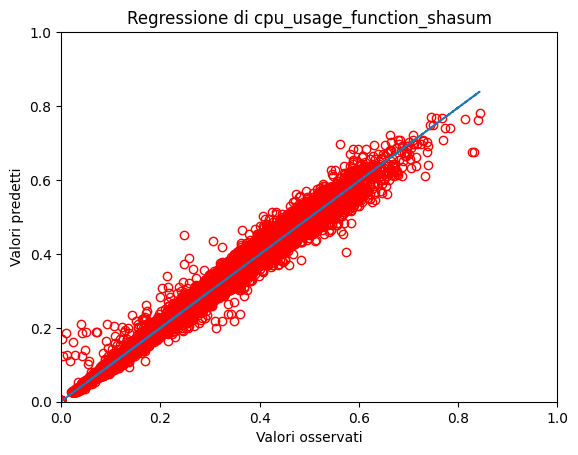

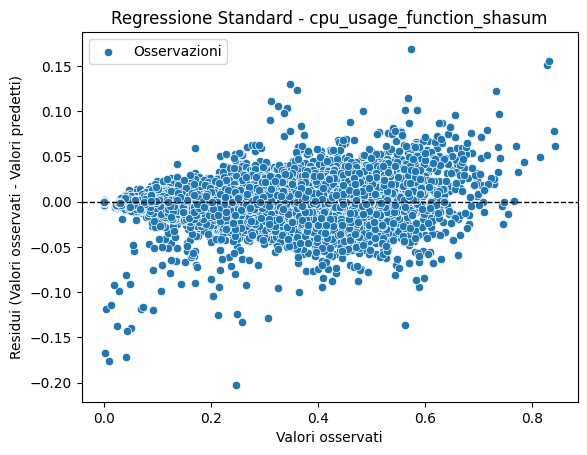

mape: 14638253901912.469
mse: 0.2195716032896957
rmse: 0.46858468102328704
R-squared score: 0.9939266552925996
Standard deviation: 5.988362147560896
Quantile loss with library:  0.13575382002658623
------------------------------
Target: cpu_usage_function_shasum quantiles
Prediction for alpha 0.05 are greater than true values in 3.036929057337221 % of cases and less or equal in 96.96307094266278 % of cases.
mape: 0.0895761252675137
mse: 0.0018511335287786492
rmse: 0.04302480132178008
R-squared score: 0.946667112855226
Standard deviation: 0.16225295192630076
Quantile loss with library:  0.0014688064262657417
Prediction for alpha 0.95 are greater than true values in 96.18966634272756 % of cases and less or equal in 3.810333657272433 % of cases.
mape: 628970836149.1139
mse: 0.0007642678966911045
rmse: 0.027645395578488375
R-squared score: 0.9779807275656156
Standard deviation: 0.19880003532611304
Quantile loss with library:  0.0011024128518065752


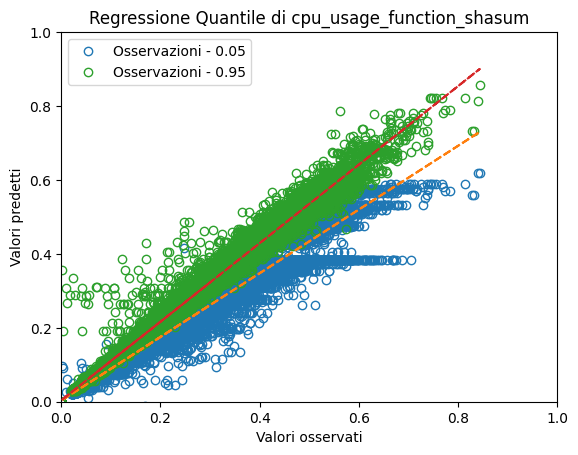

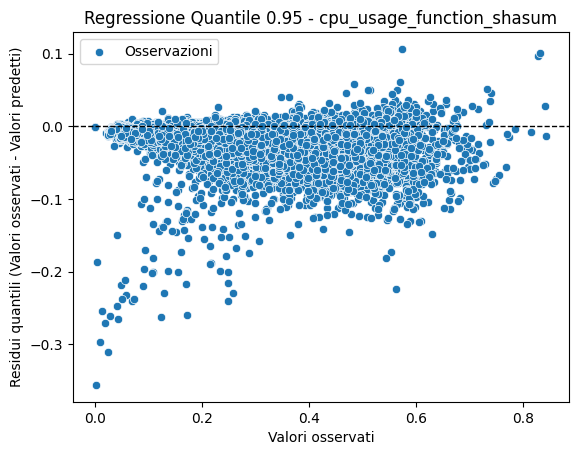

mape: 20299404765873.613
mse: 0.7960699062246784
rmse: 0.8922274969001339
R-squared score: 0.9779807275656156
Standard deviation: 6.416072340114972
Quantile loss with library:  0.035579272379205405
------------------------------
Target: ram_usage_function_shasum
mape: 1497132067253.1504
mse: 0.002051391591040999
rmse: 0.04529229063583558
R-squared score: 0.8513919958651068
Standard deviation: 0.1054566794230057


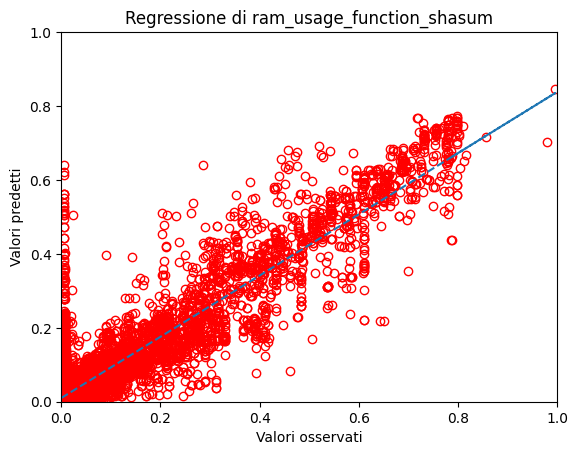

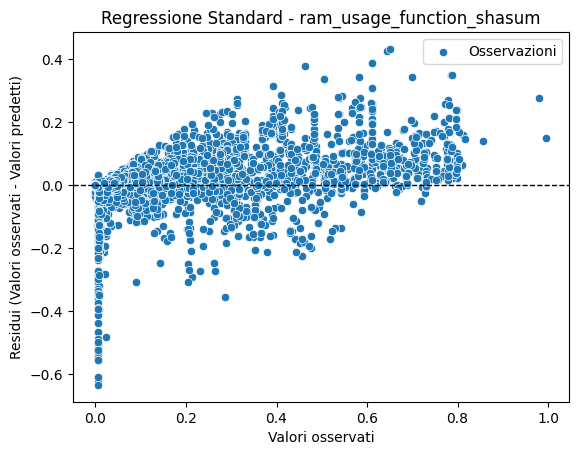

mape: 3.667489209047223e+20
mse: 123102262516628.1
rmse: 11095145.898843696
R-squared score: 0.8513919958651068
Standard deviation: 25833474.699115317
Quantile loss with library:  2722088.7944473964
------------------------------
Target: ram_usage_function_shasum quantiles
Prediction for alpha 0.05 are greater than true values in 3.6807580174927113 % of cases and less or equal in 96.3192419825073 % of cases.
mape: 0.41879250225641335
mse: 0.012358128479542554
rmse: 0.11116711959721973
R-squared score: 0.10474586314578693
Standard deviation: 0.03212680107082621
Quantile loss with library:  0.0024586357403578703
Prediction for alpha 0.95 are greater than true values in 96.30304502753482 % of cases and less or equal in 3.6969549724651767 % of cases.
mape: 7597576424126.13
mse: 0.006736727025160428
rmse: 0.08207756712500942
R-squared score: 0.5119744265390826
Standard deviation: 0.13630149369793745
Quantile loss with library:  0.00281305570788757


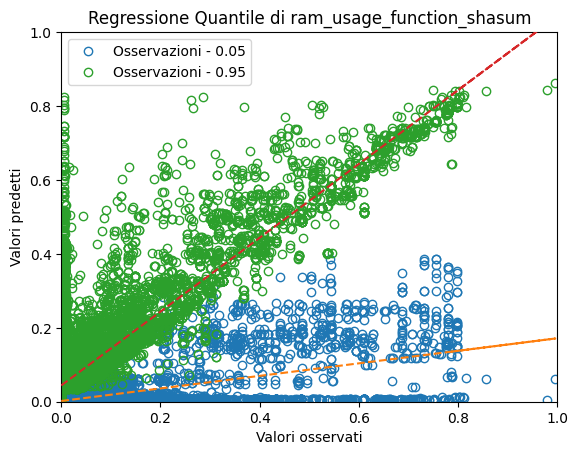

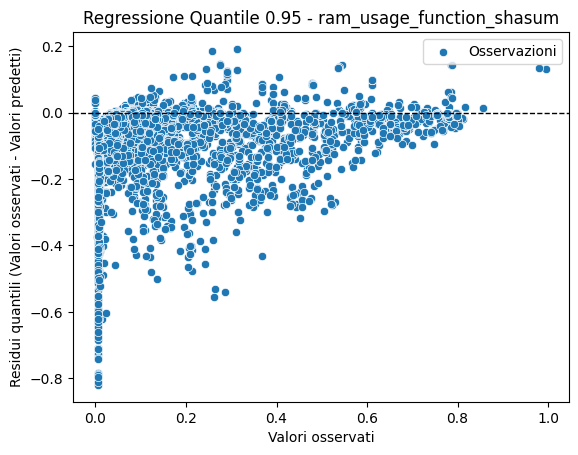

mape: 1.861160425314286e+21
mse: 404265252122498.06
rmse: 20106348.552695937
R-squared score: 0.5119744265390828
Standard deviation: 33389456.297721673
Quantile loss with library:  689107.6397865611
------------------------------
Target: power_usage_function_shasum
mape: 654264776985.9248
mse: 0.0008831190432855054
rmse: 0.02971731891146147
R-squared score: 0.9672197864839187
Standard deviation: 0.1606100598830913


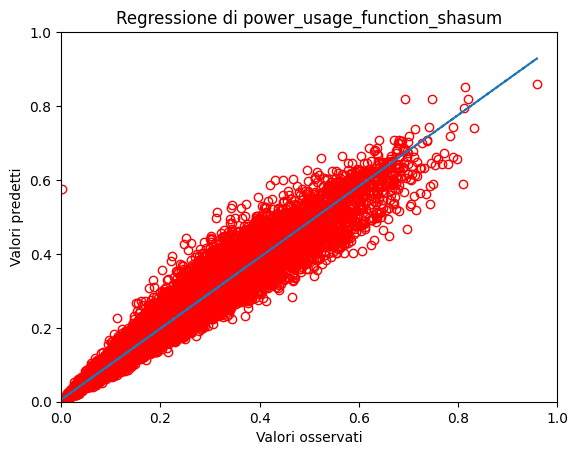

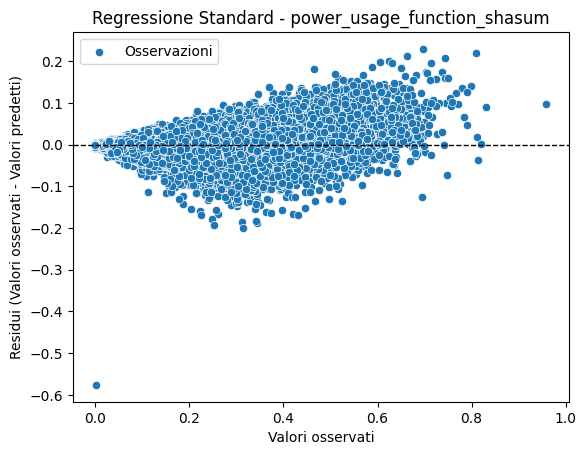

mape: 5.4046065314734504e+16
mse: 6026155.482817254
rmse: 2454.822902536404
R-squared score: 0.9672197864839188
Standard deviation: 13267.322484690661
Quantile loss with library:  713.9369359275254
------------------------------
Target: power_usage_function_shasum quantiles
Prediction for alpha 0.05 are greater than true values in 3.7536443148688043 % of cases and less or equal in 96.24635568513119 % of cases.
mape: 0.17486822341435695
mse: 0.004190640206543901
rmse: 0.06473515433320523
R-squared score: 0.8444489655341141
Standard deviation: 0.12189123675787544
Quantile loss with library:  0.0022671058979074664
Prediction for alpha 0.95 are greater than true values in 96.21396177518626 % of cases and less or equal in 3.7860382248137348 % of cases.
mape: 2057555492658.5667
mse: 0.0036813647037682003
rmse: 0.060674250747481014
R-squared score: 0.8633526001532806
Standard deviation: 0.1942924023440008
Quantile loss with library:  0.0023883995925952843


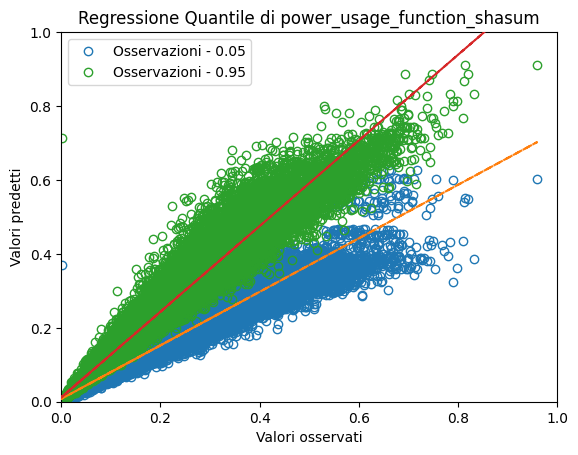

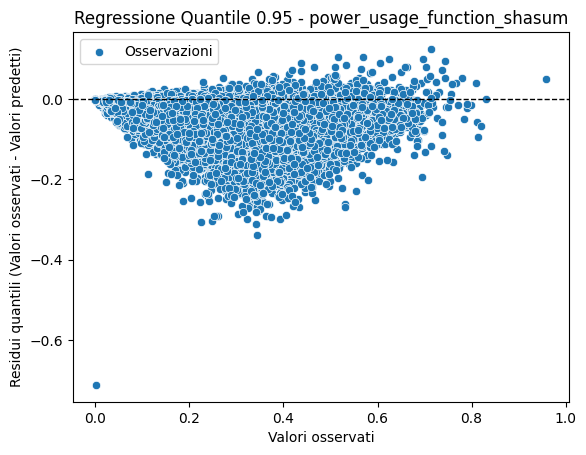

mape: 1.6996601751543523e+17
mse: 25120595.3065272
rmse: 5012.045022396267
R-squared score: 0.8633526001532806
Standard deviation: 16049.679329548062
Quantile loss with library:  197.29565906600752
------------------------------
Target: medium_latency_function_shasum
mape: 146987834676.46054
mse: 0.00020674333041742813
rmse: 0.014378571918567857
R-squared score: 0.8329874217761899
Standard deviation: 0.03000028863532331


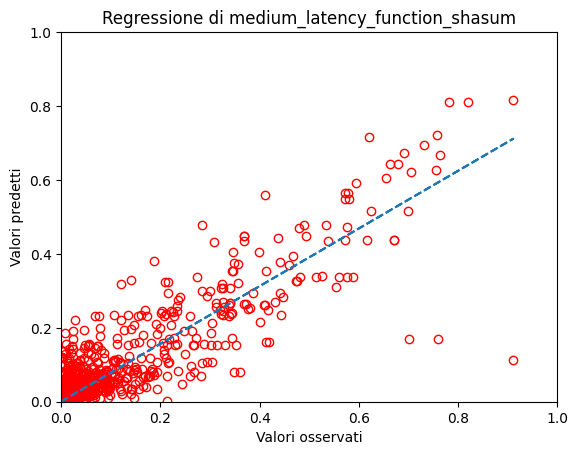

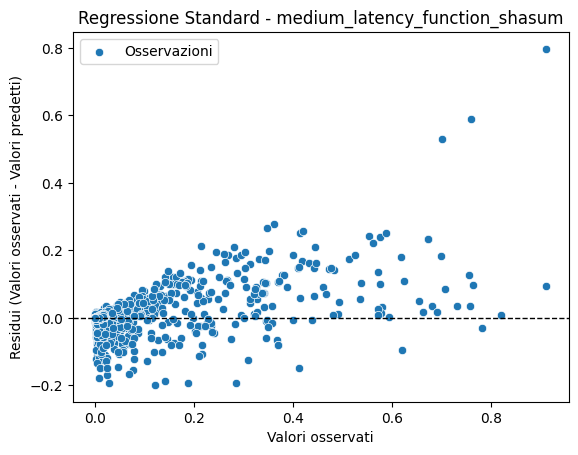

mape: 3.5543214039464306e+21
mse: 1.2088770069778466e+17
rmse: 347689086.25061077
R-squared score: 0.8329874217761899
Standard deviation: 725438729.3775889
Quantile loss with library:  30077355.47365498
------------------------------
Target: medium_latency_function_shasum quantiles
Prediction for alpha 0.05 are greater than true values in 3.6564625850340136 % of cases and less or equal in 96.34353741496598 % of cases.
mape: 0.23053997482061359
mse: 0.0012454747361979191
rmse: 0.035291284139259076
R-squared score: -0.006126516318802899
Standard deviation: 0.00034705079913093016
Quantile loss with library:  0.00021153229606271995
Prediction for alpha 0.95 are greater than true values in 96.43666990605766 % of cases and less or equal in 3.5633300939423385 % of cases.
mape: 31040778230.37133
mse: 0.0005733494618528305
rmse: 0.023944716783725603
R-squared score: 0.5368335623986682
Standard deviation: 0.04422163497906755
Quantile loss with library:  0.0005202350728640467


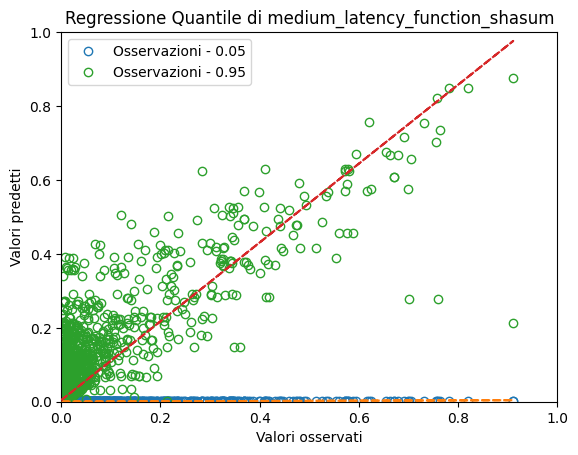

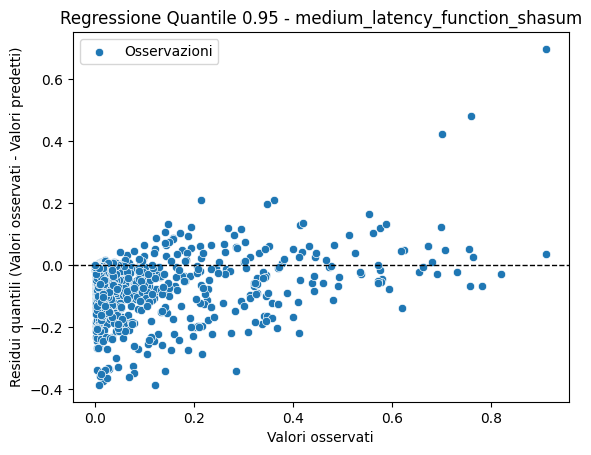

mape: 7.505988689258721e+20
mse: 3.352509510210448e+17
rmse: 579008593.218654
R-squared score: 0.5368335623986682
Standard deviation: 1069325934.832579
Quantile loss with library:  12579834.641717078
------------------------------
Target: cpu_usage_function_curl
mape: 218710498449.59097
mse: 0.00021893746472148774
rmse: 0.014796535564837052
R-squared score: 0.9945445590690974
Standard deviation: 0.19981842118167886


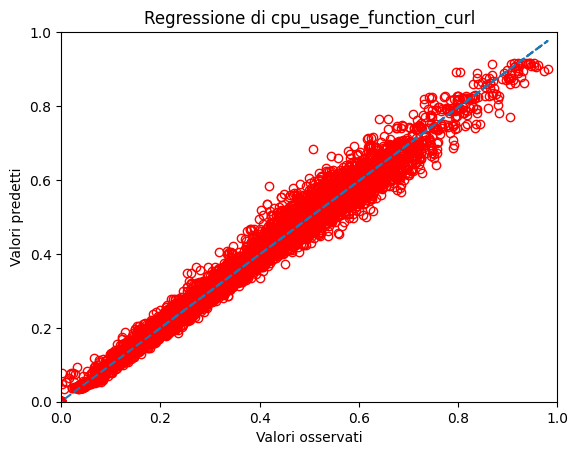

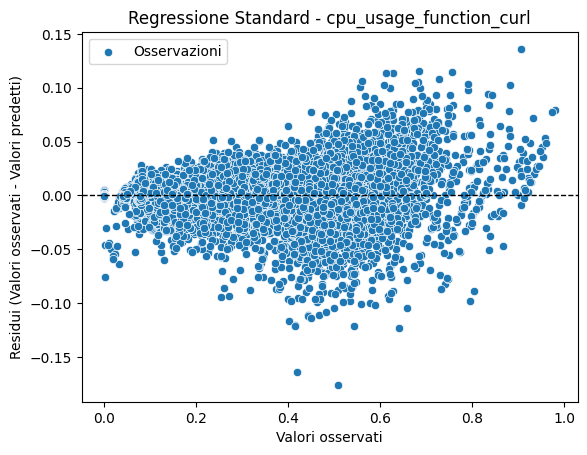

mape: 28286266185479.168
mse: 3.6621157900715713
rmse: 1.9136655376715053
R-squared score: 0.9945445590690974
Standard deviation: 25.842916048268894
Quantile loss with library:  0.41856844916061875
------------------------------
Target: cpu_usage_function_curl quantiles
Prediction for alpha 0.05 are greater than true values in 2.012471655328798 % of cases and less or equal in 97.9875283446712 % of cases.
mape: 0.052853119669317
mse: 0.001956676566002833
rmse: 0.04423433695674473
R-squared score: 0.9512439159725864
Standard deviation: 0.1684972278236253
Quantile loss with library:  0.0010718926420803729
Prediction for alpha 0.95 are greater than true values in 97.80936183997409 % of cases and less or equal in 2.190638160025915 % of cases.
mape: 536199156826.4128
mse: 0.00098243125207776
rmse: 0.03134375938010244
R-squared score: 0.9755199701832628
Standard deviation: 0.2198388068717305
Quantile loss with library:  0.0008784227508229755


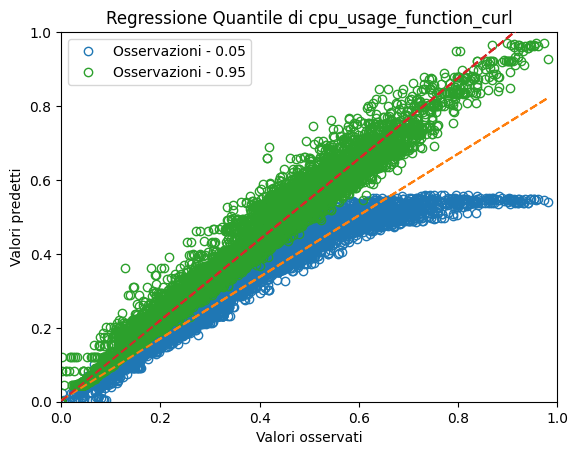

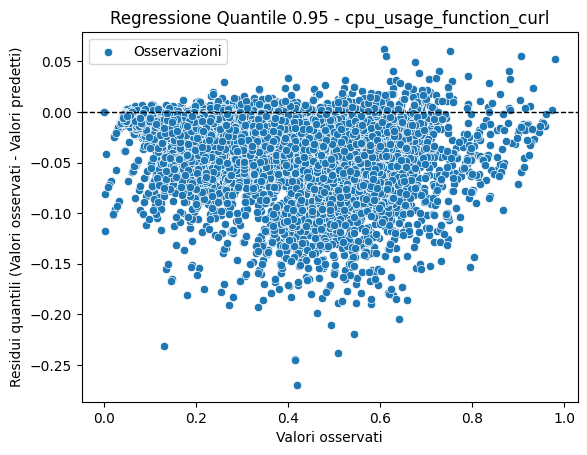

mape: 69347709350666.24
mse: 16.432897884656303
rmse: 4.053751088147409
R-squared score: 0.9755199701832628
Standard deviation: 28.432192570334646
Quantile loss with library:  0.11360817120943709
------------------------------
Target: ram_usage_function_curl
mape: 937438195457.0695
mse: 0.010903088615581681
rmse: 0.10441785582735207
R-squared score: 0.773130099695665
Standard deviation: 0.187842766314786


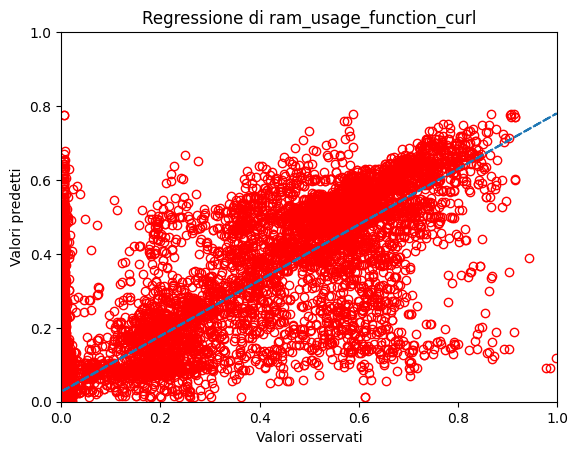

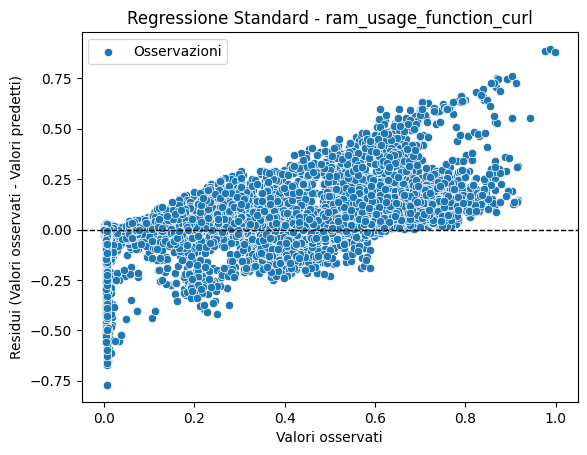

mape: 2.7142117284881292e+20
mse: 914011580281999.2
rmse: 30232624.43589705
R-squared score: 0.7731300996956652
Standard deviation: 54387056.332440995
Quantile loss with library:  6858751.392250771
------------------------------
Target: ram_usage_function_curl quantiles
Prediction for alpha 0.05 are greater than true values in 2.202785876255264 % of cases and less or equal in 97.79721412374474 % of cases.
mape: 0.288643154319797
mse: 0.04085060899126591
rmse: 0.20211533586362493
R-squared score: 0.14998640147020126
Standard deviation: 0.0775637371043854
Quantile loss with library:  0.004866743388952481
Prediction for alpha 0.95 are greater than true values in 97.92678976352445 % of cases and less or equal in 2.0732102364755427 % of cases.
mape: 43680727259.889244
mse: 0.04715302749442452
rmse: 0.21714747867388312
R-squared score: 0.01884658339659495
Standard deviation: 0.28208022202078203
Quantile loss with library:  0.005933200266585433


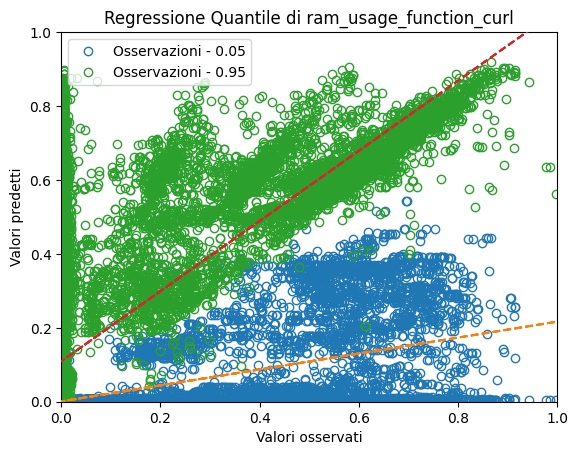

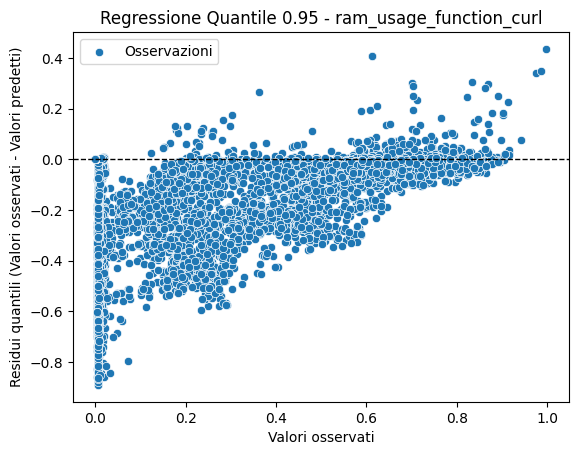

mape: 1.264709959305771e+19
mse: 3952862779971106.5
rmse: 62871796.37938705
R-squared score: 0.018846583396595173
Standard deviation: 81672098.56568286
Quantile loss with library:  1717869.1703766475
------------------------------
Target: power_usage_function_curl
mape: 213133403004.2807
mse: 0.0005047474868395055
rmse: 0.02246658600765825
R-squared score: 0.9787934500467499
Standard deviation: 0.15223753584819943


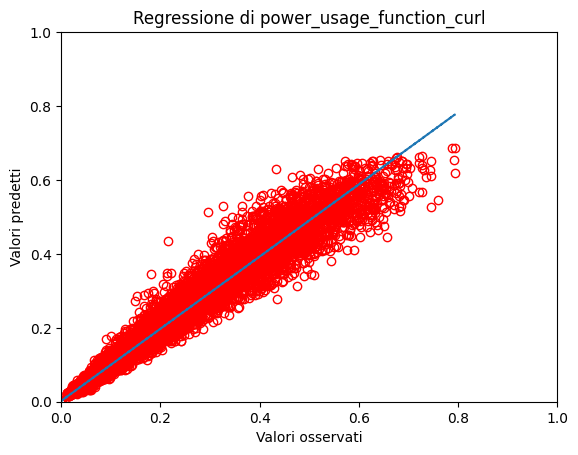

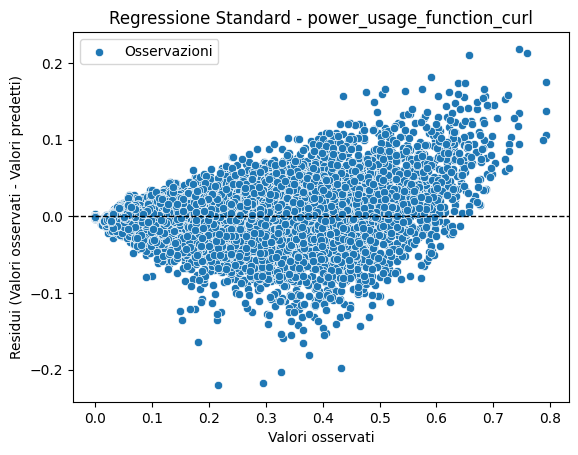

mape: 2.762344775479275e+16
mse: 8478653.613814734
rmse: 2911.812771078308
R-squared score: 0.9787934500467499
Standard deviation: 19730.95516021768
Quantile loss with library:  641.4469872194259
------------------------------
Target: power_usage_function_curl quantiles
Prediction for alpha 0.05 are greater than true values in 2.1258503401360542 % of cases and less or equal in 97.87414965986395 % of cases.
mape: 0.08711103563189397
mse: 0.0021130054376426134
rmse: 0.045967438884960875
R-squared score: 0.9112238167931578
Standard deviation: 0.12014088010727027
Quantile loss with library:  0.0012848705921277134
Prediction for alpha 0.95 are greater than true values in 97.49352121801101 % of cases and less or equal in 2.5064787819889864 % of cases.
mape: 223950134555.759
mse: 0.0020626530335043926
rmse: 0.04541644012364237
R-squared score: 0.913339331583156
Standard deviation: 0.1840259084460156
Quantile loss with library:  0.0013849551999327245


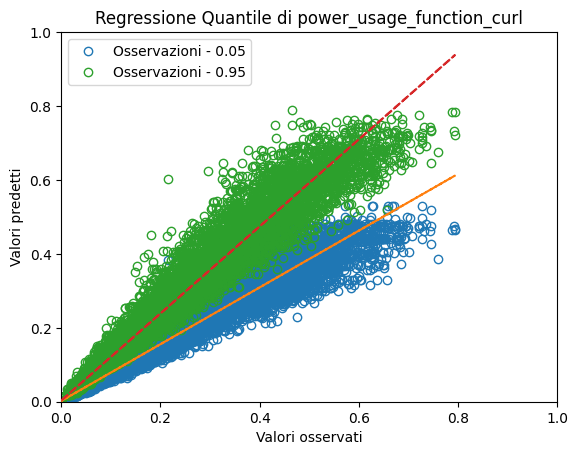

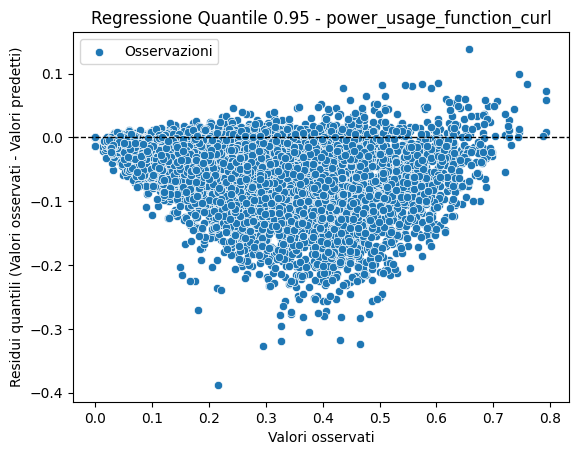

mape: 2.902536512052045e+16
mse: 34648058.78692522
rmse: 5886.26016982984
R-squared score: 0.9133393315831559
Standard deviation: 23850.930899769963
Quantile loss with library:  179.49902300068064
------------------------------
Target: medium_latency_function_curl
mape: 593491505778.5853
mse: 0.00030996922135832327
rmse: 0.017605942785273478
R-squared score: 0.989455259428166
Standard deviation: 0.1686780887406776


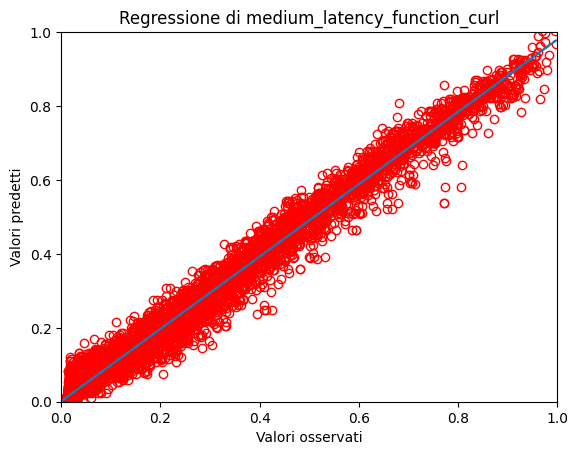

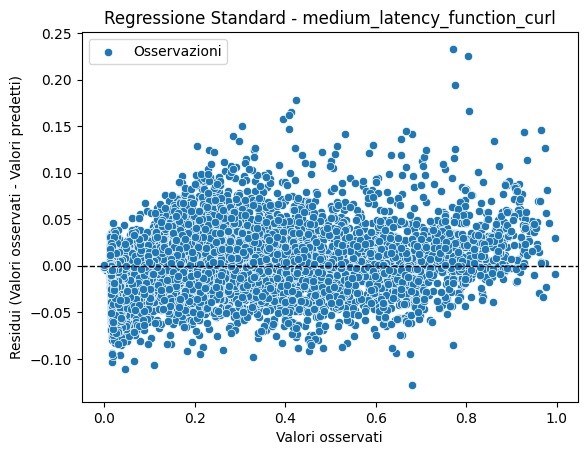

mape: 1.6647714364696702e+22
mse: 2.438926928316088e+17
rmse: 493854930.9580788
R-squared score: 0.989455259428166
Standard deviation: 4731499294.593105
Quantile loss with library:  101555770.62334666
------------------------------
Target: medium_latency_function_curl quantiles
Prediction for alpha 0.05 are greater than true values in 2.1501457725947524 % of cases and less or equal in 97.84985422740526 % of cases.
mape: 0.15209257463552223
mse: 0.01862719117593309
rmse: 0.13648146825094273
R-squared score: 0.3663277351491919
Standard deviation: 0.05889425322894408
Quantile loss with library:  0.002363246233899647
Prediction for alpha 0.95 are greater than true values in 98.12925170068027 % of cases and less or equal in 1.870748299319728 % of cases.
mape: 608994995055.3584
mse: 0.006354063072246977
rmse: 0.07971237715842489
R-squared score: 0.7838432268200559
Standard deviation: 0.1992931202470366
Quantile loss with library:  0.0019620026677268938


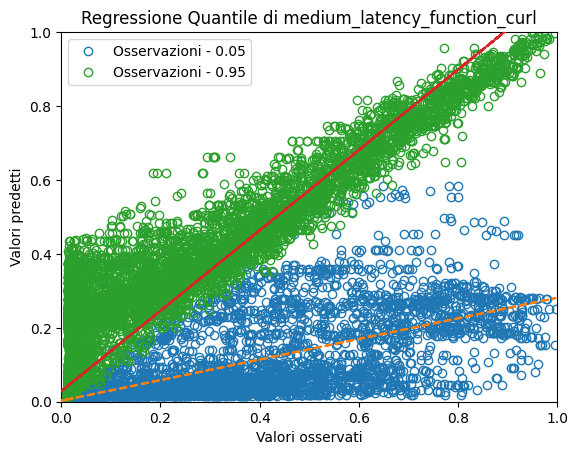

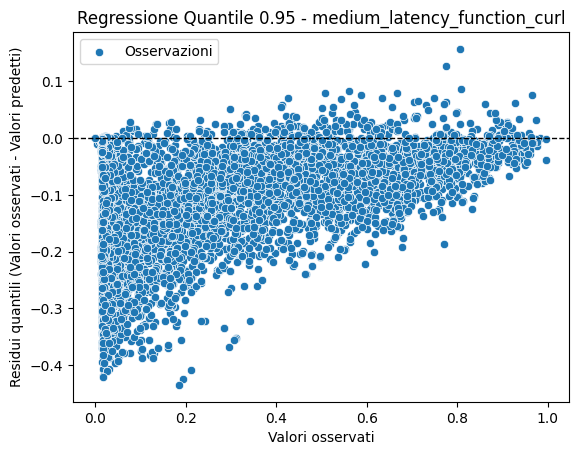

mape: 1.70825944912151e+22
mse: 4.999559460520571e+18
rmse: 2235969467.7075915
R-squared score: 0.7838432268200559
Standard deviation: 5590265249.660219
Quantile loss with library:  55035092.62908131
------------------------------
Target: cpu_usage_function_eat-memory
mape: 19652659751.377327
mse: 3.9240207876976134e-05
rmse: 0.006264200497827008
R-squared score: 0.9962362596003729
Standard deviation: 0.10173635974613088


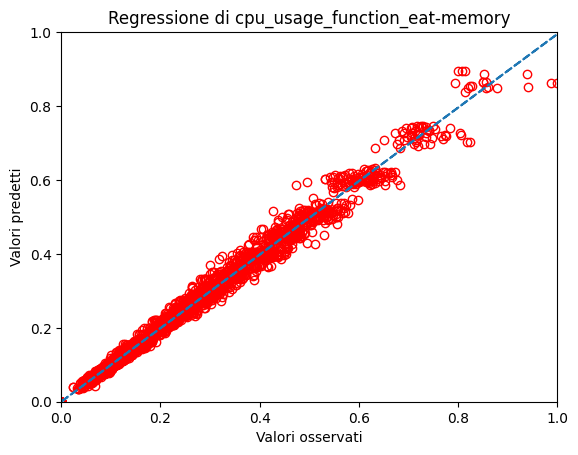

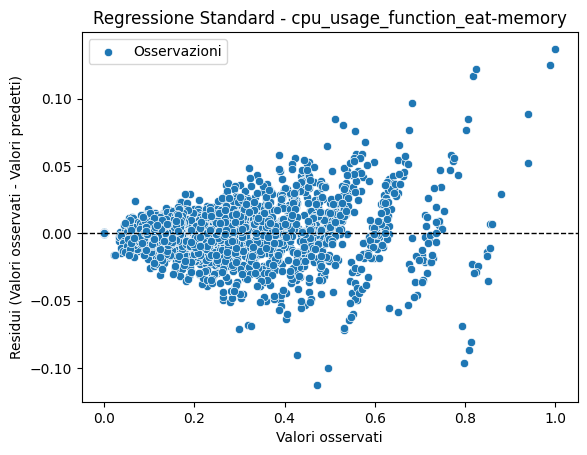

mape: 6104843267186.509
mse: 3.78649742713625
rmse: 1.9458924500434884
R-squared score: 0.9962362596003729
Standard deviation: 31.603077582458855
Quantile loss with library:  0.2408957629616802
------------------------------
Target: cpu_usage_function_eat-memory quantiles
Prediction for alpha 0.05 are greater than true values in 0.716715257531584 % of cases and less or equal in 99.28328474246841 % of cases.
mape: 0.016026603948722382
mse: 0.00041961220837373285
rmse: 0.02048443820010041
R-squared score: 0.9597527254242799
Standard deviation: 0.08585197215702516
Quantile loss with library:  0.0002544796924581807
Prediction for alpha 0.95 are greater than true values in 99.15775834143182 % of cases and less or equal in 0.8422416585681892 % of cases.
mape: 39058527604.82399
mse: 0.00013578002307106446
rmse: 0.011652468539801532
R-squared score: 0.9869766042041096
Standard deviation: 0.11067477353038052
Quantile loss with library:  0.00020312692375590676


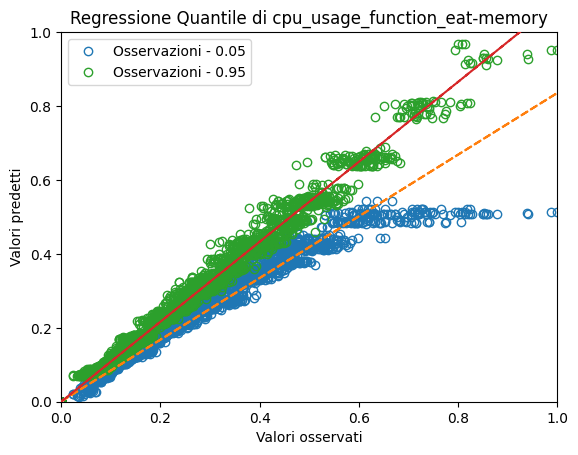

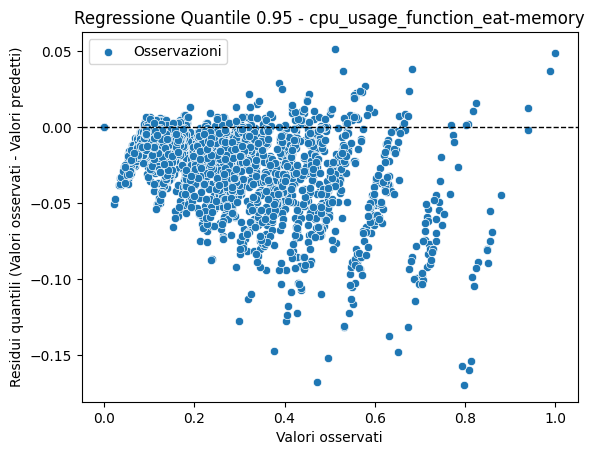

mape: 12133023839575.07
mse: 13.102140274765162
rmse: 3.619687869798329
R-squared score: 0.9869766042041096
Standard deviation: 34.3796796251568
Quantile loss with library:  0.0630987382147636
------------------------------
Target: ram_usage_function_eat-memory
mape: 158520930890.71982
mse: 0.00104019849464592
rmse: 0.032252108375204244
R-squared score: 0.9223556425260045
Standard deviation: 0.11001318667509676


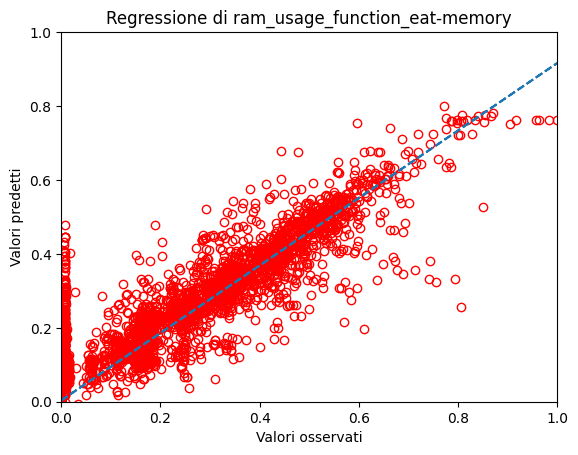

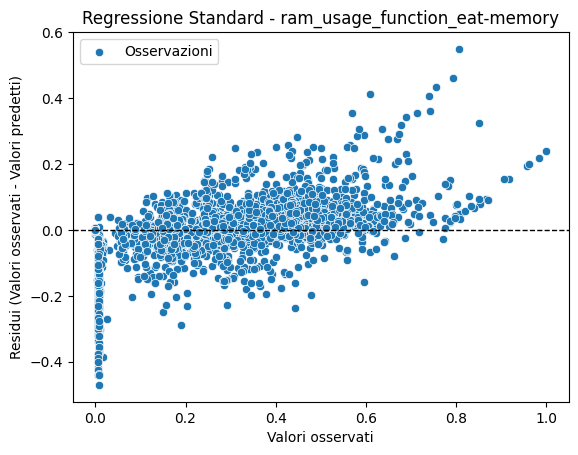

mape: 5.114945824322346e+19
mse: 108299155306320.12
rmse: 10406688.008503
R-squared score: 0.9223556425260045
Standard deviation: 35497614.51964863
Quantile loss with library:  1231180.610008592
------------------------------
Target: ram_usage_function_eat-memory quantiles
Prediction for alpha 0.05 are greater than true values in 0.7896015549076772 % of cases and less or equal in 99.21039844509232 % of cases.
mape: 0.07924266873354495
mse: 0.005525954329374791
rmse: 0.07433676297347626
R-squared score: 0.5875218282439456
Standard deviation: 0.06542847606047898
Quantile loss with library:  0.001141475404932347
Prediction for alpha 0.95 are greater than true values in 99.16990605766117 % of cases and less or equal in 0.8300939423388403 % of cases.
mape: 34692982148.57525
mse: 0.003328798351602411
rmse: 0.05769573945797394
R-squared score: 0.7515258765504712
Standard deviation: 0.14043483365378695
Quantile loss with library:  0.0007812350945346514


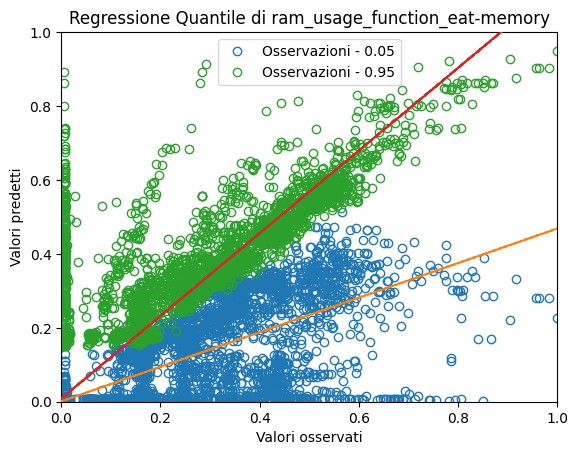

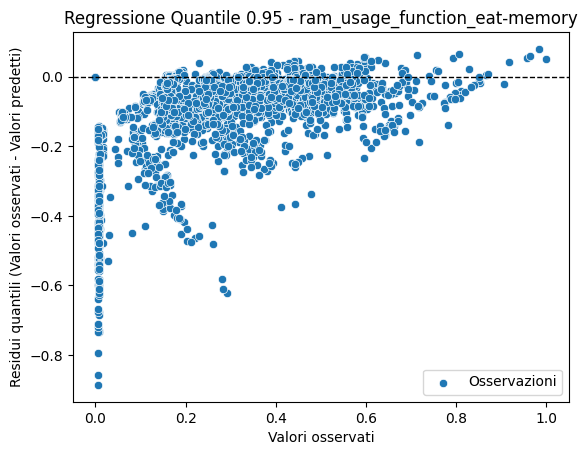

mape: 1.1194277195647121e+19
mse: 346574285118848.4
rmse: 18616505.717208274
R-squared score: 0.7515258765504712
Standard deviation: 45313673.21351819
Quantile loss with library:  252078.71049961945
------------------------------
Target: power_usage_function_eat-memory
mape: 46666737917.42134
mse: 8.647788327424985e-05
rmse: 0.009299348540314523
R-squared score: 0.9819904167517095
Standard deviation: 0.06906333060193287


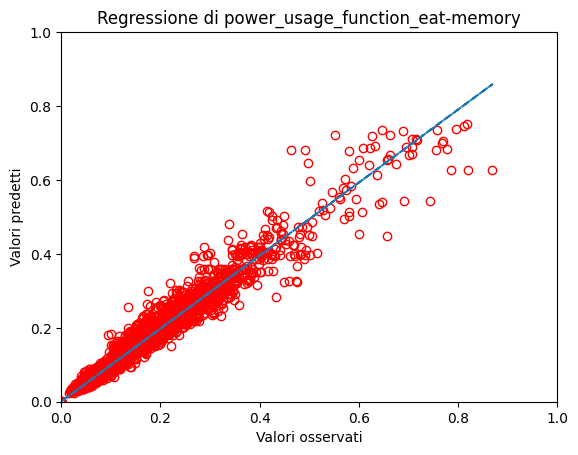

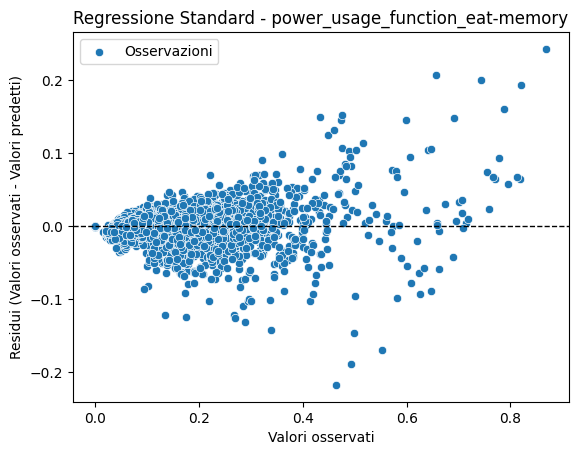

mape: 2745487398474724.5
mse: 299315.406828081
rmse: 547.0972553651508
R-squared score: 0.9819904167517095
Standard deviation: 4063.118879230174
Quantile loss with library:  58.562580442321774
------------------------------
Target: power_usage_function_eat-memory quantiles
Prediction for alpha 0.05 are greater than true values in 0.9029802397149336 % of cases and less or equal in 99.09701976028506 % of cases.
mape: 0.025909276847445664
mse: 0.0003917141180877693
rmse: 0.019791768947917954
R-squared score: 0.9184229799328008
Standard deviation: 0.05328992793011435
Quantile loss with library:  0.0002870186780059107
Prediction for alpha 0.95 are greater than true values in 99.1537091026887 % of cases and less or equal in 0.8462908973113056 % of cases.
mape: 20895094616.16196
mse: 0.0003132676484922427
rmse: 0.017699368590213684
R-squared score: 0.9347599688971897
Standard deviation: 0.08234223678212509
Quantile loss with library:  0.000289957162880073


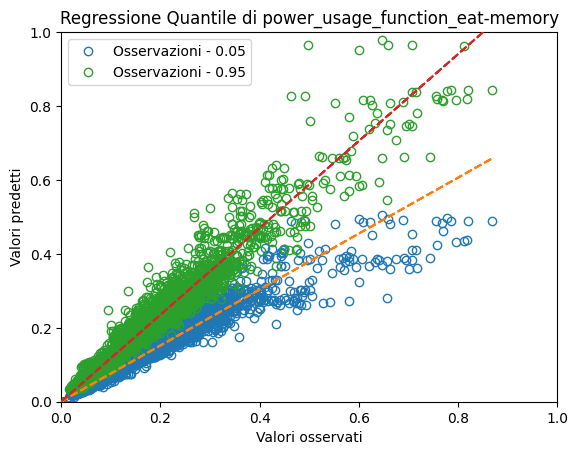

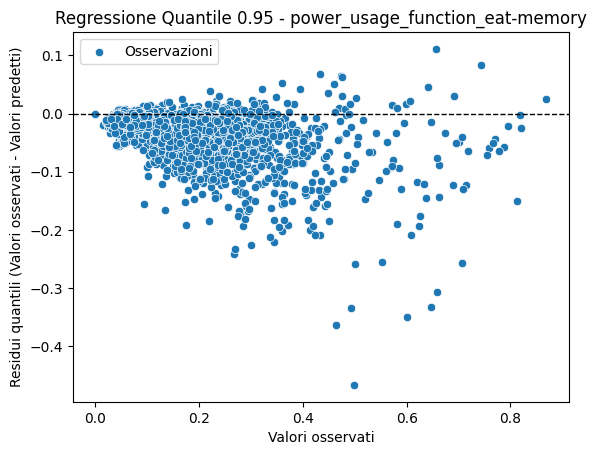

mape: 1229295672220626.2
mse: 1084275.309528213
rmse: 1041.2854121364676
R-squared score: 0.9347599688971896
Standard deviation: 4844.340606100602
Quantile loss with library:  17.05869688585611
------------------------------
Target: medium_latency_function_eat-memory
mape: 148442905418.8066
mse: 0.00016308741398939855
rmse: 0.01277056827198377
R-squared score: 0.9804911791260082
Standard deviation: 0.08878110186301236


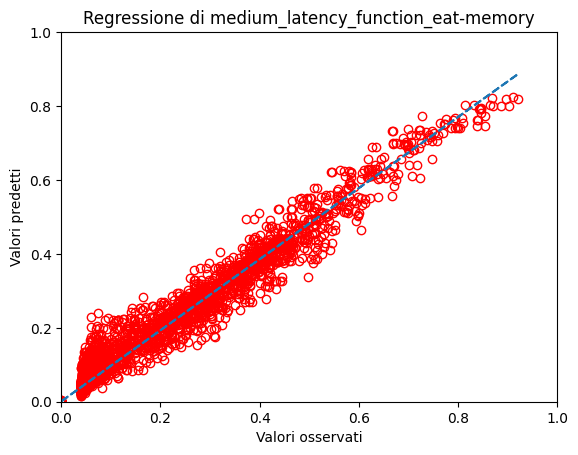

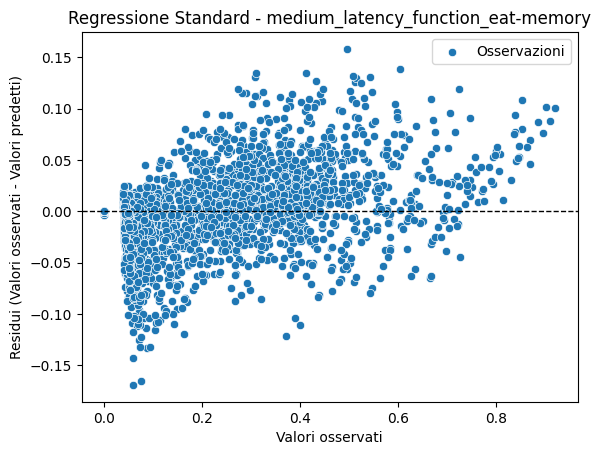

mape: 4.058146195490684e+21
mse: 1.2188687185101974e+17
rmse: 349123003.8983678
R-squared score: 0.9804911791260082
Standard deviation: 2427106164.0867014
Quantile loss with library:  42724490.63680622
------------------------------
Target: medium_latency_function_eat-memory quantiles
Prediction for alpha 0.05 are greater than true values in 0.7936507936507936 % of cases and less or equal in 99.20634920634922 % of cases.
mape: 0.054664228825497777
mse: 0.006058815230220597
rmse: 0.0778383917499623
R-squared score: 0.2752332130137881
Standard deviation: 0.02168971782426168
Quantile loss with library:  0.0008590506421785903
Prediction for alpha 0.95 are greater than true values in 99.21039844509232 % of cases and less or equal in 0.7896015549076772 % of cases.
mape: 17965378555.119564
mse: 0.001301472554659733
rmse: 0.03607592763408493
R-squared score: 0.8443154237339026
Standard deviation: 0.10901768961467607
Quantile loss with library:  0.0005920355759116488


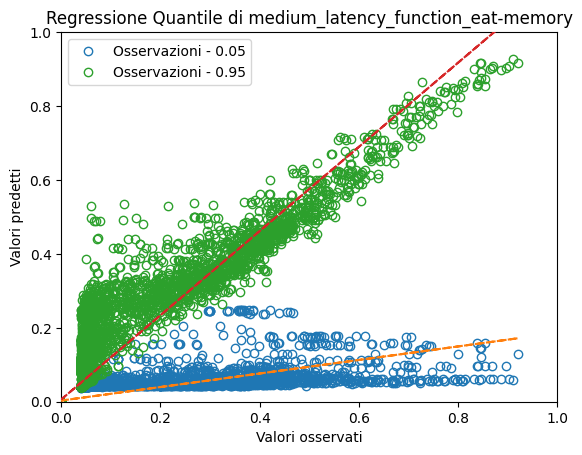

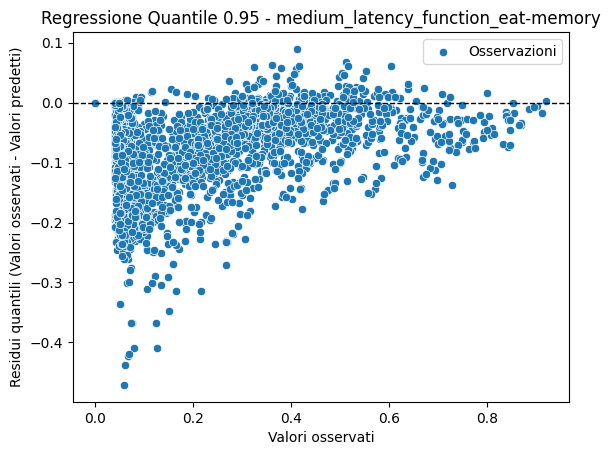

mape: 4.911392190000505e+20
mse: 9.726833886626108e+17
rmse: 986247123.525646
R-squared score: 0.8443154237339024
Standard deviation: 2980335915.029983
Quantile loss with library:  16185124.598599203
------------------------------
Target: cpu_usage_node
mape: 0.05646349207071068
mse: 0.0005472521944325823
rmse: 0.023393422033396102
R-squared score: 0.9836922205895939
Standard deviation: 0.18146436317601372


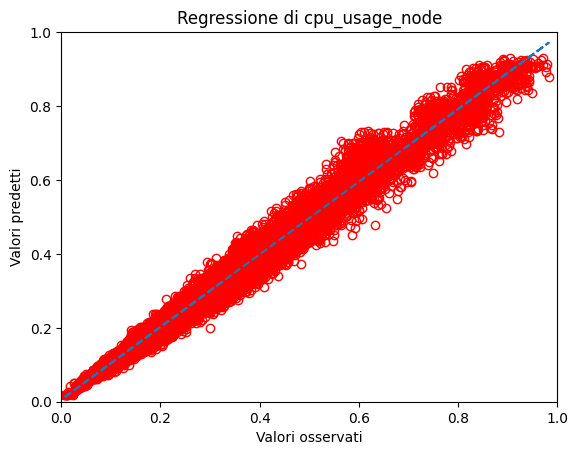

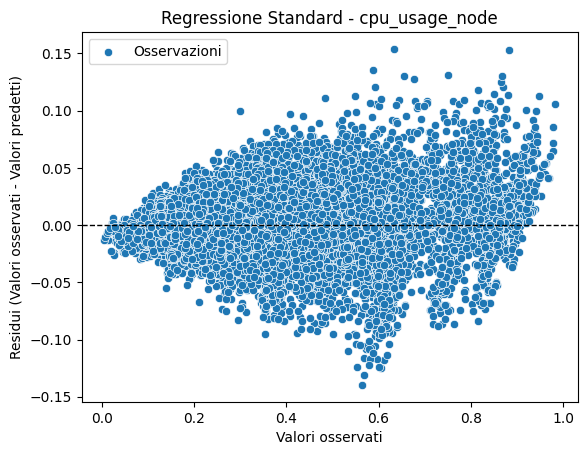

mape: 0.03563313009839169
mse: 95.67071248342151
rmse: 9.781140653493411
R-squared score: 0.9836922205895939
Standard deviation: 75.87297220933897
Quantile loss with library:  3.4568406344629015
------------------------------
Target: cpu_usage_node quantiles
Prediction for alpha 0.05 are greater than true values in 4.616132167152575 % of cases and less or equal in 95.38386783284743 % of cases.
mape: 0.14109376219620157
mse: 0.006984020081007137
rmse: 0.08357044980737592
R-squared score: 0.7918804894021461
Standard deviation: 0.13614940297773892
Quantile loss with library:  0.002942676327206594
Prediction for alpha 0.95 are greater than true values in 95.22189828312277 % of cases and less or equal in 4.778101716877227 % of cases.
mape: 0.20407692633421537
mse: 0.0032705206815244136
rmse: 0.05718846633303269
R-squared score: 0.9025404916159884
Standard deviation: 0.19081699781946318
Quantile loss with library:  0.002825033737466494


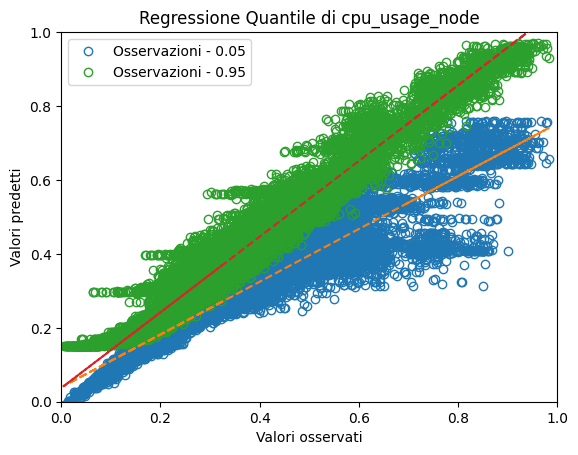

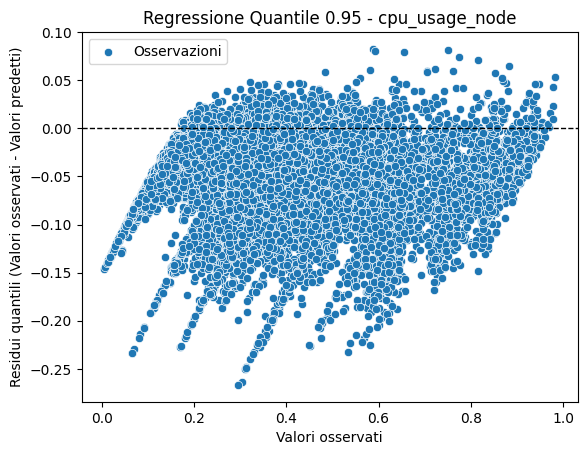

mape: 0.11195517341188804
mse: 571.7529266696291
rmse: 23.911355600835957
R-squared score: 0.9025404916159885
Standard deviation: 79.78344904328483
Quantile loss with library:  1.1811889811408036
------------------------------
Target: ram_usage_node
mape: 0.04595604851196846
mse: 0.0008421866345159838
rmse: 0.029020452003991663
R-squared score: 0.9521782827565403
Standard deviation: 0.12690085172223423


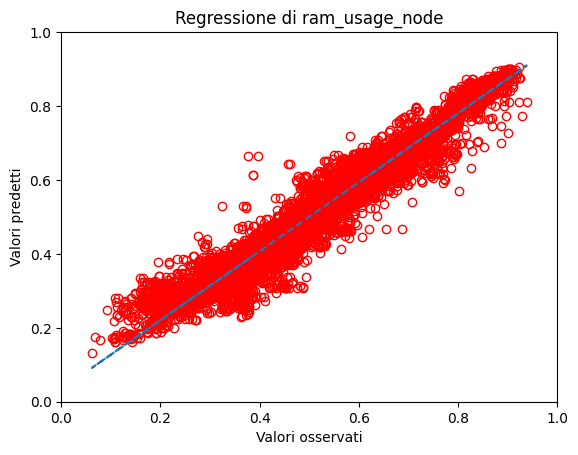

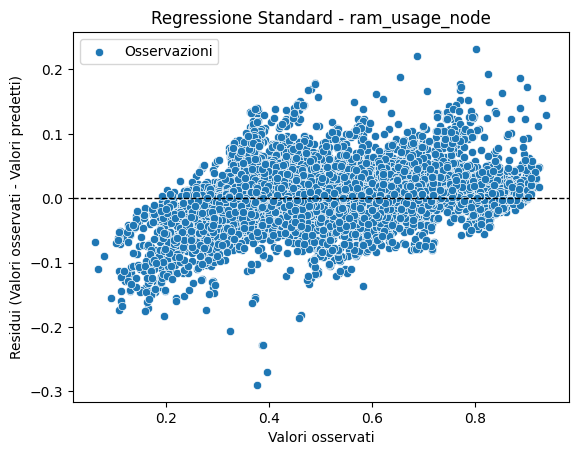

mape: 0.015404420950259222
mse: 9223022581223560.0
rmse: 96036568.97881952
R-squared score: 0.9521782827565403
Standard deviation: 419949434.2202871
Quantile loss with library:  32742071.517867148
------------------------------
Target: ram_usage_node quantiles
Prediction for alpha 0.05 are greater than true values in 4.891480401684483 % of cases and less or equal in 95.10851959831552 % of cases.
mape: 0.10558738291887883
mse: 0.0059702474525762704
rmse: 0.07726737637953207
R-squared score: 0.6609926186792632
Standard deviation: 0.12083857511103314
Quantile loss with library:  0.003092006639067937
Prediction for alpha 0.95 are greater than true values in 95.0032393909945 % of cases and less or equal in 4.9967606090055074 % of cases.
mape: 0.1428535737911127
mse: 0.00615115584695208
rmse: 0.0784293047715717
R-squared score: 0.6507201330706779
Standard deviation: 0.11185868308144176
Quantile loss with library:  0.0033673873966258423


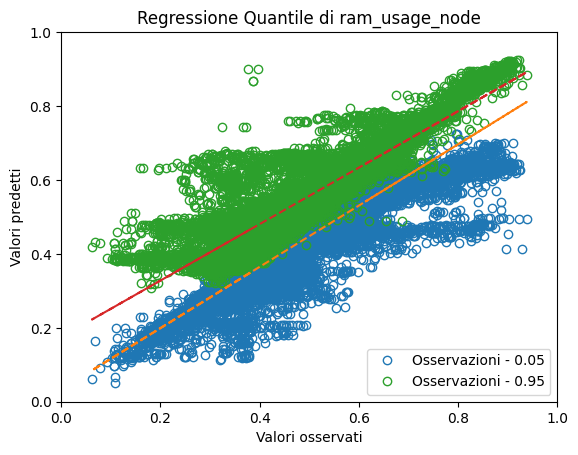

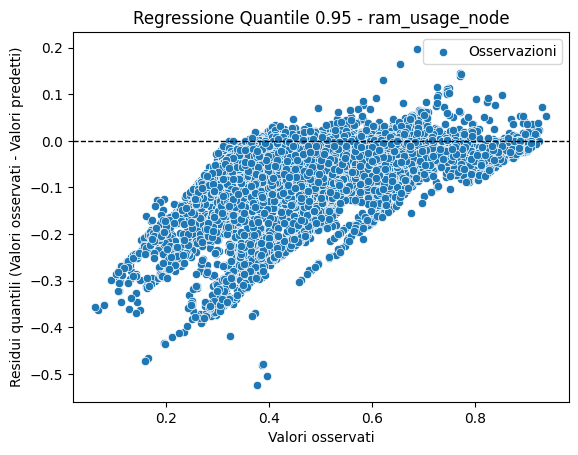

mape: 0.04514949512124066
mse: 6.736303682813627e+16
rmse: 259543901.54294953
R-squared score: 0.650720133070678
Standard deviation: 370170806.8555651
Quantile loss with library:  11143600.79401877
------------------------------
Target: ram_usage_node_percentage
mape: 10277088845.083607
mse: 0.0003408675266316681
rmse: 0.01846259804663656
R-squared score: 0.9928620917346661
Standard deviation: 0.21701989837898258


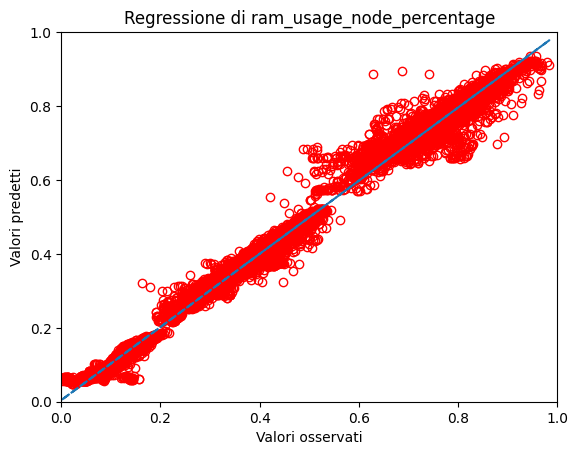

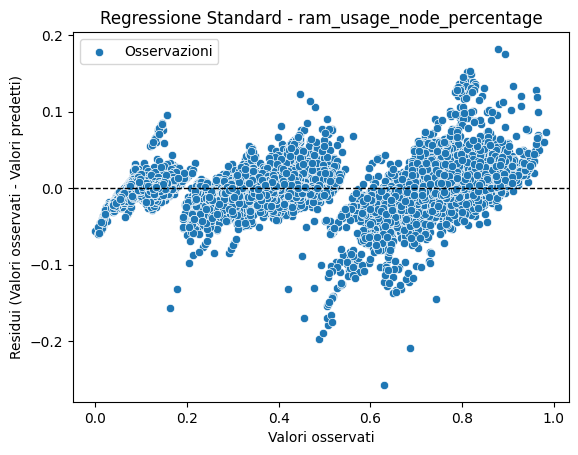

mape: 0.016293523891304573
mse: 0.6593797078378036
rmse: 0.8120219872871692
R-squared score: 0.9928620917346661
Standard deviation: 9.544969170504412
Quantile loss with library:  0.23532207876470201
------------------------------
Target: ram_usage_node_percentage quantiles
Prediction for alpha 0.05 are greater than true values in 4.3610301263362485 % of cases and less or equal in 95.63896987366375 % of cases.
mape: 2510112879.0736575
mse: 0.0038420030236789495
rmse: 0.0619838932600958
R-squared score: 0.9195468532624717
Standard deviation: 0.18720134551044496
Quantile loss with library:  0.002062258286481256
Prediction for alpha 0.95 are greater than true values in 95.33527696793003 % of cases and less or equal in 4.664723032069971 % of cases.
mape: 33956437435.958218
mse: 0.002991427268809258
rmse: 0.05469394179257204
R-squared score: 0.9373582645487616
Standard deviation: 0.21942334813897235
Quantile loss with library:  0.002113203174123192


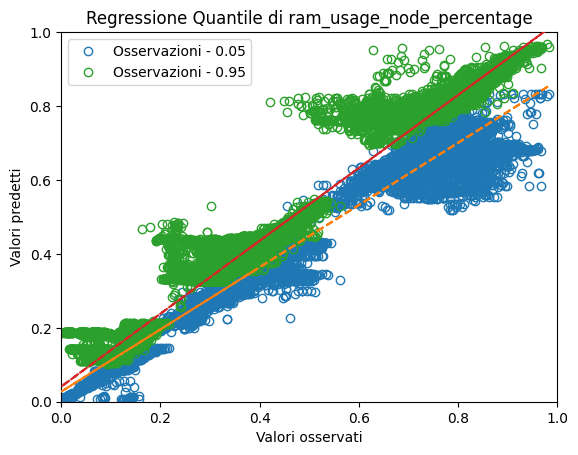

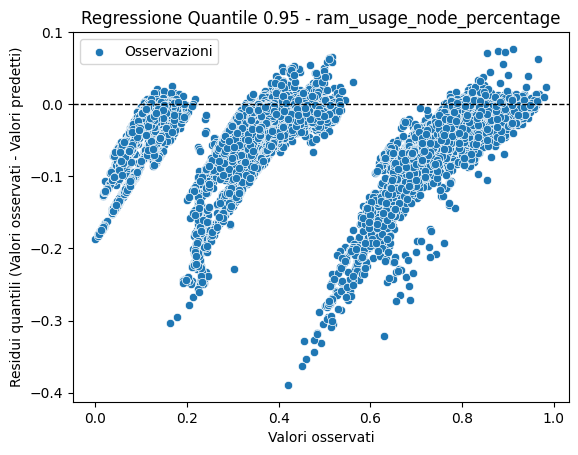

mape: 0.0645487845229303
mse: 5.786665740843366
rmse: 2.4055489479209036
R-squared score: 0.9373582645487616
Standard deviation: 9.650677697848282
Quantile loss with library:  0.09294290200428623
------------------------------
Target: power_usage_node
mape: 3493684480.299461
mse: 0.0010000498655863006
rmse: 0.03162356503600283
R-squared score: 0.9522117567497602
Standard deviation: 0.14034475580408098


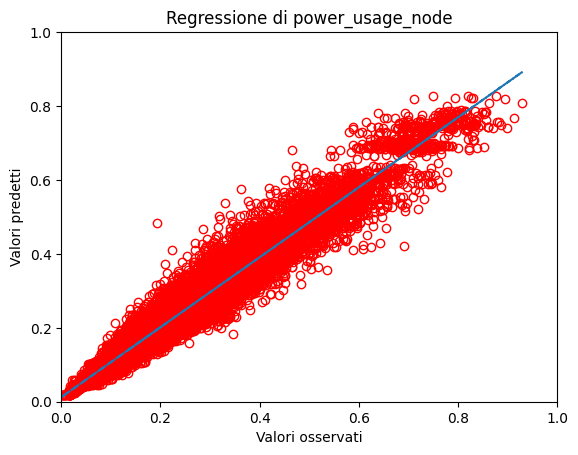

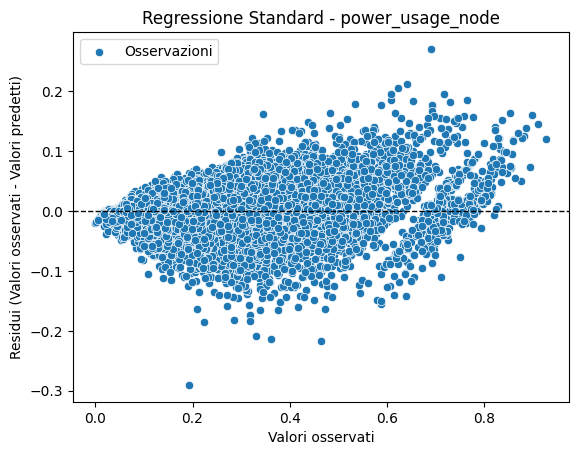

mape: 0.08900581651344204
mse: 15995507734.898481
rmse: 126473.34792318294
R-squared score: 0.9522117567497602
Standard deviation: 561286.2151941373
Quantile loss with library:  44728.45392222813
------------------------------
Target: power_usage_node quantiles
Prediction for alpha 0.05 are greater than true values in 5.110139293812764 % of cases and less or equal in 94.88986070618724 % of cases.
mape: 155877352.75762138
mse: 0.004693376302691173
rmse: 0.0685082206942435
R-squared score: 0.7757229752874141
Standard deviation: 0.11192708721854315
Quantile loss with library:  0.003004542409904274
Prediction for alpha 0.95 are greater than true values in 94.75218658892129 % of cases and less or equal in 5.247813411078718 % of cases.
mape: 12403661242.624792
mse: 0.004030223616205399
rmse: 0.06348404221696503
R-squared score: 0.8074122969746409
Standard deviation: 0.1566271389157851
Quantile loss with library:  0.0032070737928328766


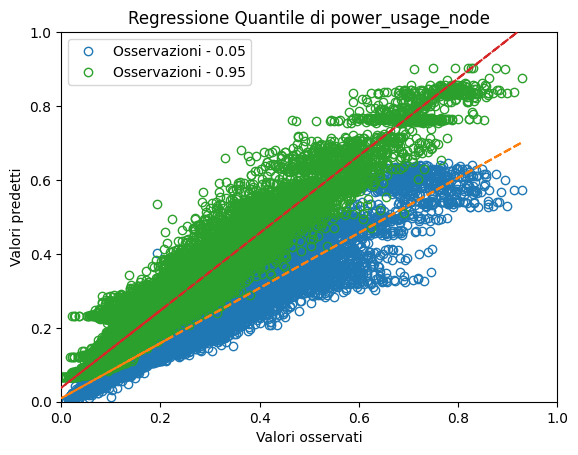

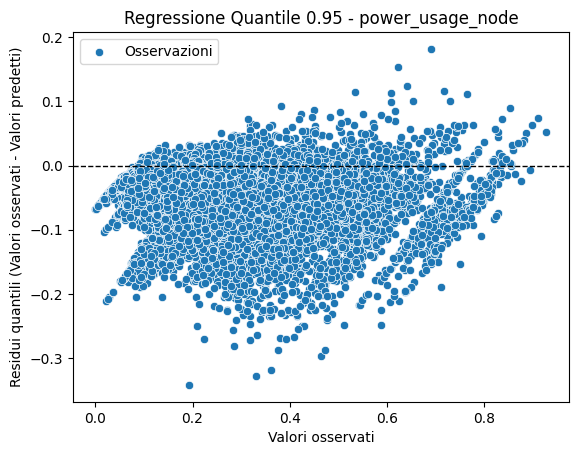

mape: 0.23004944471708166
mse: 64462258578.06573
rmse: 253894.18775951868
R-squared score: 0.8074122969746408
Standard deviation: 626404.9803289553
Quantile loss with library:  12826.17437833134
------------------------------
Target: overloaded_node
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.96      0.98     22766
           1       0.97      1.00      0.98     22604

    accuracy                           0.98     45370
   macro avg       0.98      0.98      0.98     45370
weighted avg       0.98      0.98      0.98     45370

Classification Report:
               precision    recall  f1-score   support

         0.0       1.00      0.96      0.98     22766
         1.0       0.97      1.00      0.98     22604

    accuracy                           0.98     45370
   macro avg       0.98      0.98      0.98     45370
weighted avg       0.98      0.98      0.98     45370

------------------------------
Target: cpu_usage

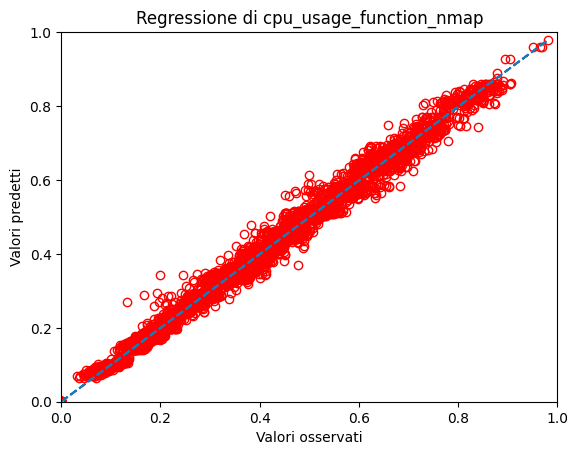

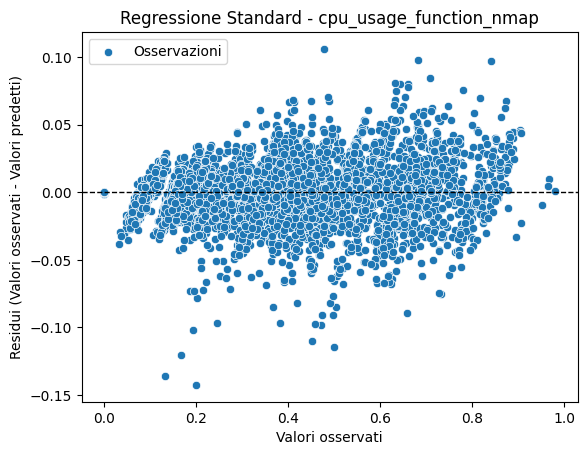

mape: 11554567216463.277
mse: 12.205075045487996
rmse: 3.493576254425828
R-squared score: 0.9970983420153061
Standard deviation: 64.76530272797024
Quantile loss with library:  0.5858358512198847
------------------------------
Target: cpu_usage_function_nmap quantiles
Prediction for alpha 0.05 are greater than true values in 1.101392938127632 % of cases and less or equal in 98.89860706187237 % of cases.
mape: 0.024326208752062987
mse: 0.0007472658201060182
rmse: 0.027336163229429587
R-squared score: 0.9758304432143938
Standard deviation: 0.15423230965279067
Quantile loss with library:  0.000537197015804391
Prediction for alpha 0.95 are greater than true values in 98.81762228701004 % of cases and less or equal in 1.182377712989958 % of cases.
mape: 107399065065.21011
mse: 0.0004217116883163865
rmse: 0.020535619988604835
R-squared score: 0.9863601621756624
Standard deviation: 0.1893981470258045
Quantile loss with library:  0.00043301360816504084


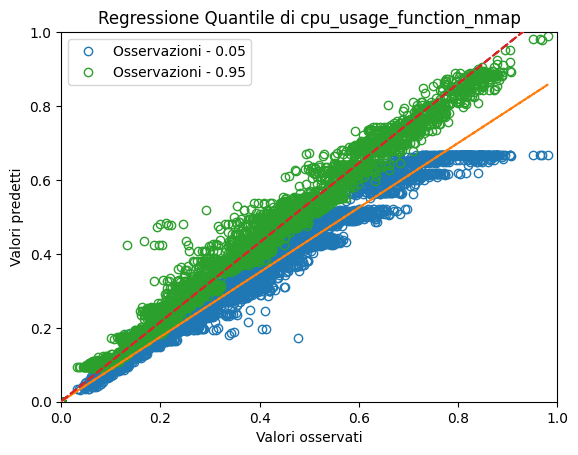

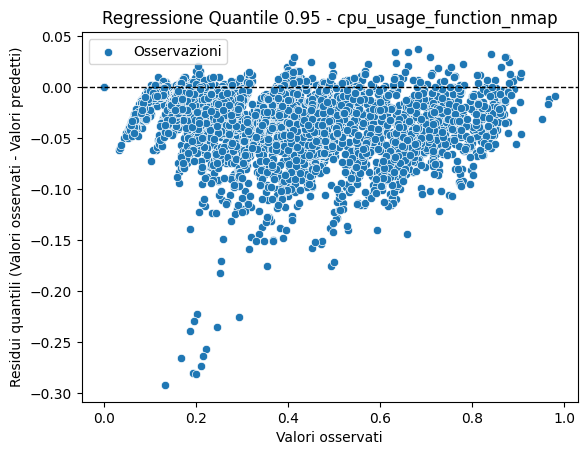

mape: 39613608153968.266
mse: 57.3724557244443
rmse: 7.5744607546969505
R-squared score: 0.9863601621756624
Standard deviation: 69.85855953973287
Quantile loss with library:  0.1597149043036345
------------------------------
Target: ram_usage_function_nmap
mape: 627783546673.404
mse: 0.00791742551801936
rmse: 0.08897991637453567
R-squared score: 0.7052390067824676
Standard deviation: 0.13419877378009606


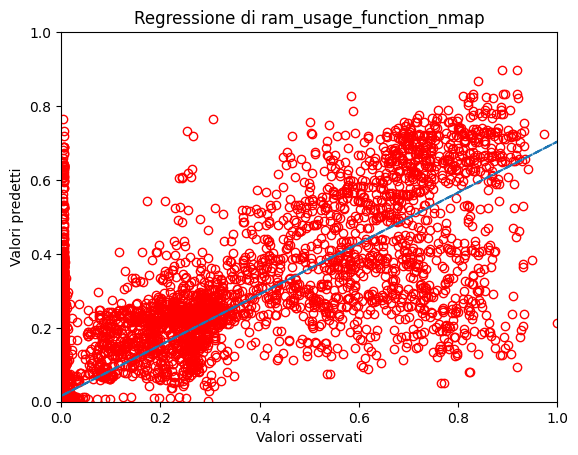

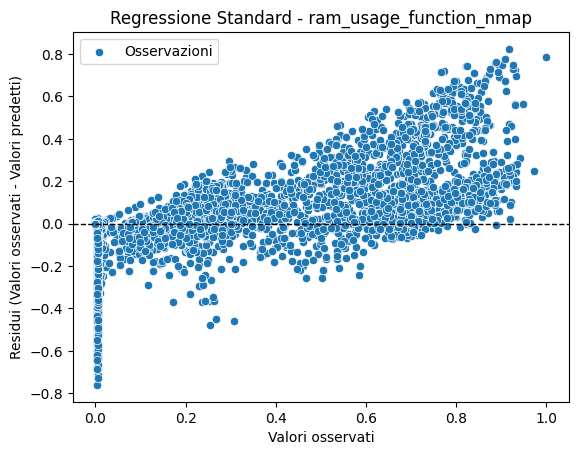

mape: 2.107050394195617e+20
mse: 891895501453043.8
rmse: 29864619.55982436
R-squared score: 0.7052390067824675
Standard deviation: 45041572.16183286
Quantile loss with library:  4843741.451916759
------------------------------
Target: ram_usage_function_nmap quantiles
Prediction for alpha 0.05 are greater than true values in 1.405085843861354 % of cases and less or equal in 98.59491415613864 % of cases.
mape: 0.14098291655525555
mse: 0.025269692722385235
rmse: 0.15896443854644104
R-squared score: 0.059224528453100334
Standard deviation: 0.029118717899861334
Quantile loss with library:  0.0024315652540435944
Prediction for alpha 0.95 are greater than true values in 98.62325882734046 % of cases and less or equal in 1.37674117265954 % of cases.
mape: 44387155022.64497
mse: 0.03546852375411654
rmse: 0.18833088900686618
R-squared score: -0.3204718207868169
Standard deviation: 0.2502178117154113
Quantile loss with library:  0.0036629410830862396


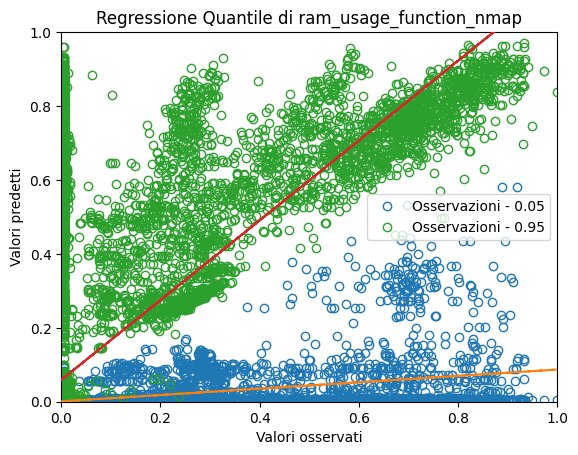

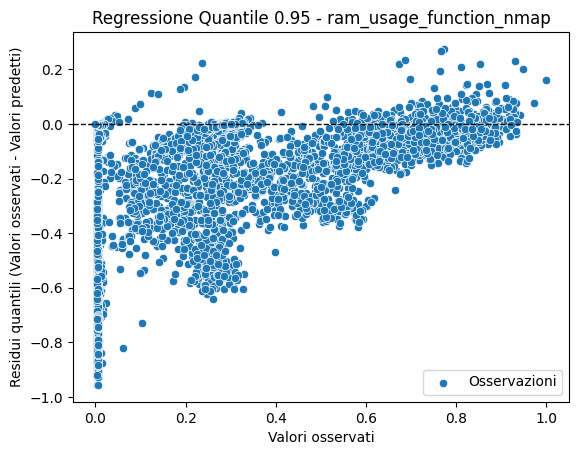

mape: 1.4897805615280894e+19
mse: 3995518076864794.5
rmse: 63210110.55887178
R-squared score: -0.32047182078681713
Standard deviation: 83981420.28498301
Quantile loss with library:  1229404.8631824462
------------------------------
Target: power_usage_function_nmap
mape: 96035637566.78377
mse: 0.00020865666632700493
rmse: 0.014444952970743967
R-squared score: 0.9903982761735861
Standard deviation: 0.14670353663035138


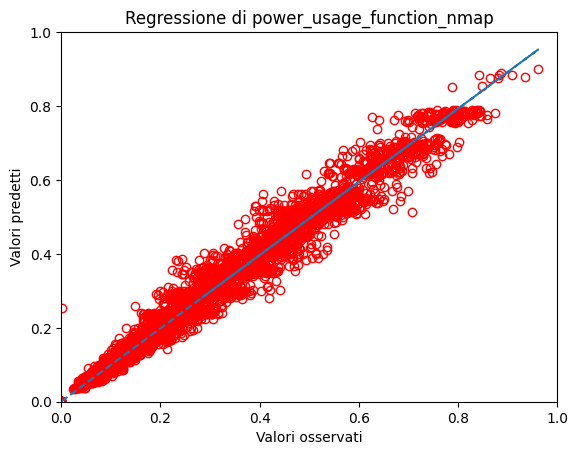

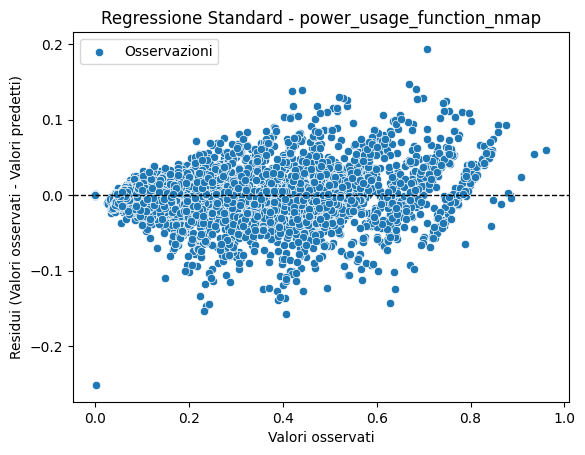

mape: 5442914290174895.0
mse: 670240.0996687168
rmse: 818.6819282656219
R-squared score: 0.9903982761735861
Standard deviation: 8314.567343706387
Quantile loss with library:  130.46879496117887
------------------------------
Target: power_usage_function_nmap quantiles
Prediction for alpha 0.05 are greater than true values in 1.251214771622935 % of cases and less or equal in 98.74878522837707 % of cases.
mape: 0.045610944581967176
mse: 0.0009645684998011757
rmse: 0.031057503116013296
R-squared score: 0.9556135899716013
Standard deviation: 0.12333902452190477
Quantile loss with library:  0.0006638875489567705
Prediction for alpha 0.95 are greater than true values in 98.67589893100097 % of cases and less or equal in 1.324101068999028 % of cases.
mape: 74633259387.21431
mse: 0.0008213279309316807
rmse: 0.028658819426690987
R-squared score: 0.962205070642858
Standard deviation: 0.16664511207857383
Quantile loss with library:  0.0006602124626050376


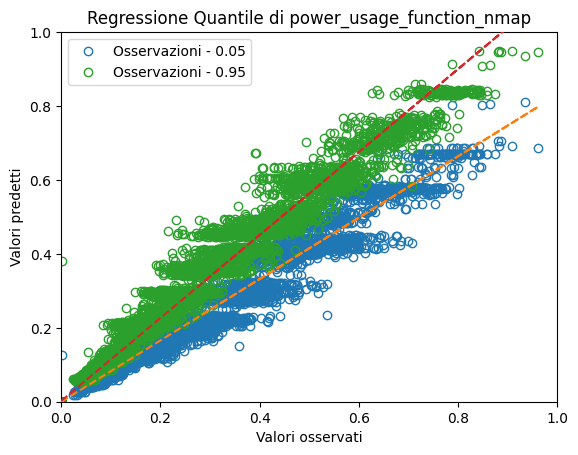

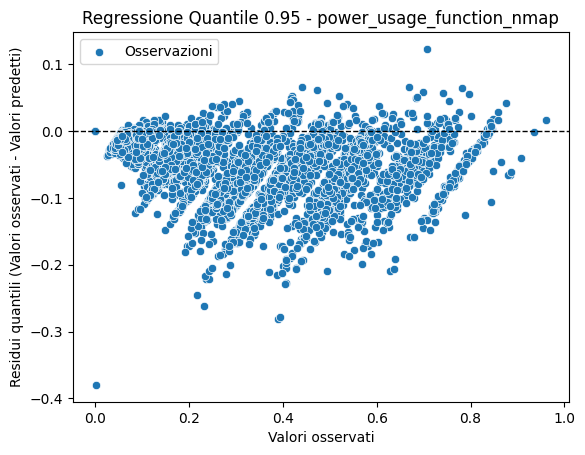

mape: 4229913439771674.0
mse: 2638242.6403076537
rmse: 1624.2668008389674
R-squared score: 0.962205070642858
Standard deviation: 9444.77576139183
Quantile loss with library:  37.41819118727453
------------------------------
Target: medium_latency_function_nmap
mape: 542938832307.52136
mse: 0.00016214523303761672
rmse: 0.012733626075773417
R-squared score: 0.9955613006372405
Standard deviation: 0.18954316769938498


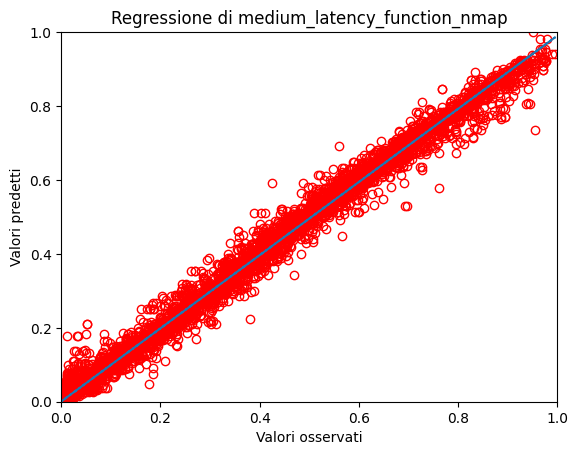

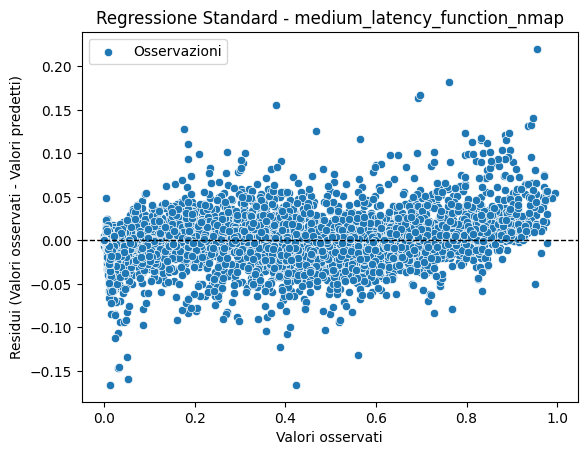

mape: 1.6051901381379906e+22
mse: 1.4172789663197182e+17
rmse: 376467656.8205718
R-squared score: 0.9955613006372405
Standard deviation: 5603814010.676615
Quantile loss with library:  60142219.36915644
------------------------------
Target: medium_latency_function_nmap quantiles
Prediction for alpha 0.05 are greater than true values in 1.0082604470359573 % of cases and less or equal in 98.99173955296405 % of cases.
mape: 0.08693573578745632
mse: 0.010143336369188138
rmse: 0.1007141319239169
R-squared score: 0.7223278178783983
Standard deviation: 0.11655737512891994
Quantile loss with library:  0.0015034986246596149
Prediction for alpha 0.95 are greater than true values in 98.73663751214772 % of cases and less or equal in 1.2633624878522838 % of cases.
mape: 55826294603.54503
mse: 0.006923698870263782
rmse: 0.08320876678730302
R-squared score: 0.8104648703656379
Standard deviation: 0.2231530509993541
Quantile loss with library:  0.0014518645270779793


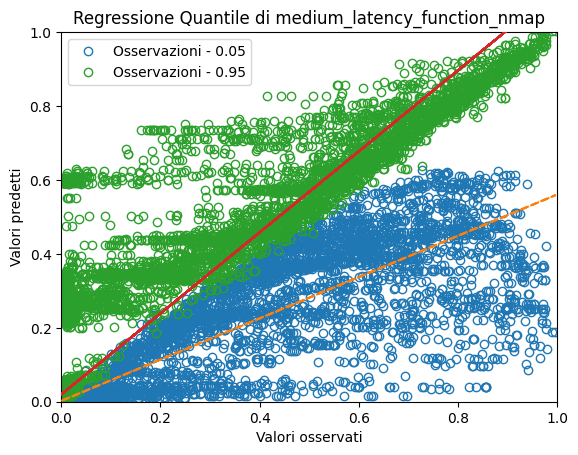

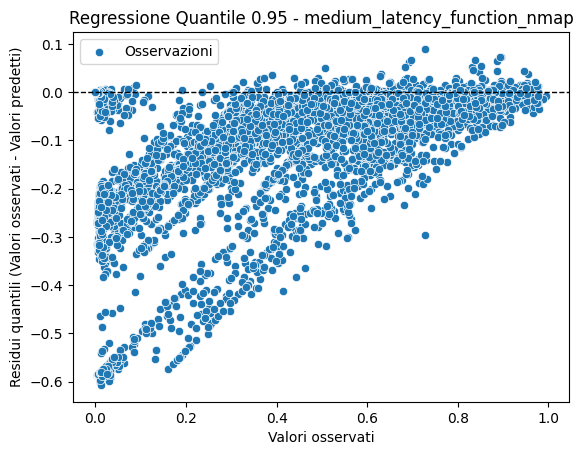

mape: 1.6504956398805999e+21
mse: 6.051866338666853e+18
rmse: 2460054133.2797647
R-squared score: 0.8104648703656379
Standard deviation: 6597484936.511754
Quantile loss with library:  42924146.92228632
------------------------------
Target: cpu_usage_function_env
mape: 372178542525.2626
mse: 0.00018475679630358273
rmse: 0.013592527222837655
R-squared score: 0.9945114150667624
Standard deviation: 0.18276192280532547


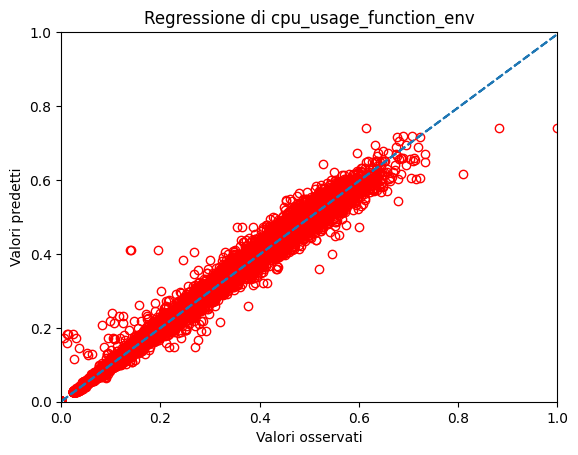

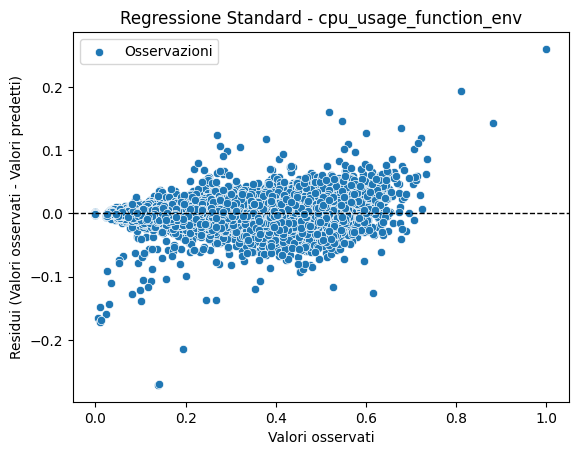

mape: 12103618381463.113
mse: 0.19540164060036083
rmse: 0.4420425778139034
R-squared score: 0.9945114150667624
Standard deviation: 5.94360049155199
Quantile loss with library:  0.11052069119266703
------------------------------
Target: cpu_usage_function_env quantiles
Prediction for alpha 0.05 are greater than true values in 2.4052478134110786 % of cases and less or equal in 97.59475218658892 % of cases.
mape: 0.06938775742973151
mse: 0.0017897529463403194
rmse: 0.0423054718250526
R-squared score: 0.9468316659953336
Standard deviation: 0.15560485409713923
Quantile loss with library:  0.0012298190914866137
Prediction for alpha 0.95 are greater than true values in 96.9428247489472 % of cases and less or equal in 3.057175251052802 % of cases.
mape: 357771795458.0761
mse: 0.000674724664994839
rmse: 0.025975462748425465
R-squared score: 0.9799559003811185
Standard deviation: 0.1971167264401227
Quantile loss with library:  0.0009160102400456548


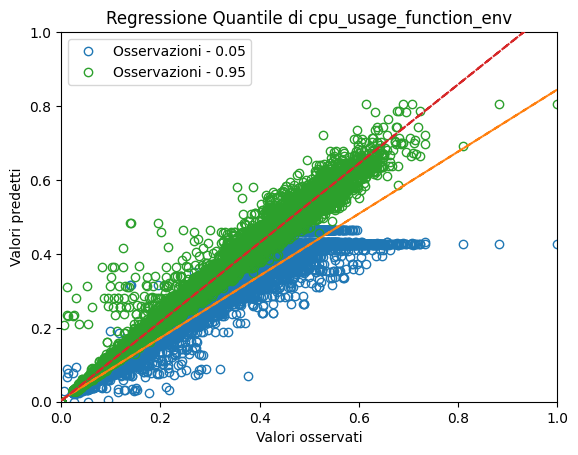

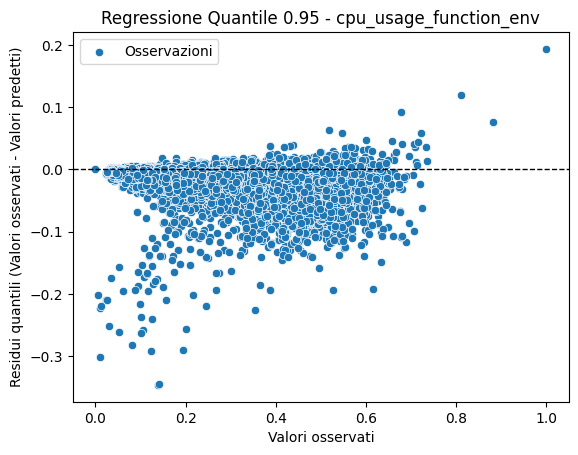

mape: 11635096560090.092
mse: 0.7135992241220938
rmse: 0.8447480240415445
R-squared score: 0.9799559003811185
Standard deviation: 6.410433060559231
Quantile loss with library:  0.02978956901652474
------------------------------
Target: ram_usage_function_env
mape: 1590999042532.685
mse: 0.0037073819955978377
rmse: 0.0608882746971684
R-squared score: 0.8504828226940578
Standard deviation: 0.141557397647554


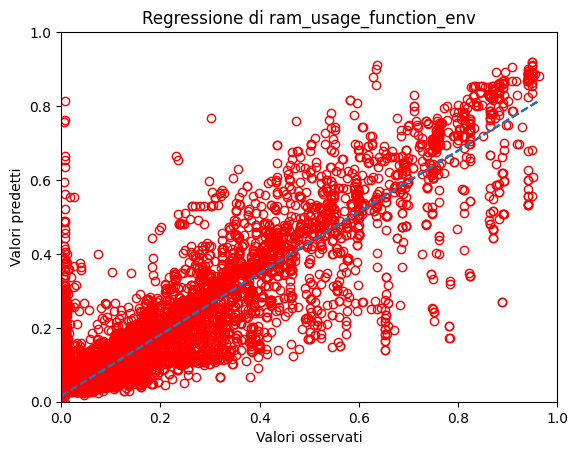

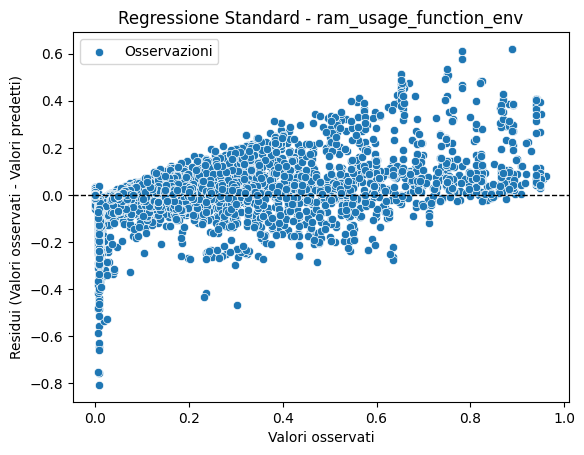

mape: 3.227332455844722e+20
mse: 152550948039955.25
rmse: 12351151.688808426
R-squared score: 0.8504828226940578
Standard deviation: 28714837.129376277
Quantile loss with library:  2678796.1430290435
------------------------------
Target: ram_usage_function_env quantiles
Prediction for alpha 0.05 are greater than true values in 3.2677356656948495 % of cases and less or equal in 96.73226433430516 % of cases.
mape: 0.3129665518511812
mse: 0.015935720747510925
rmse: 0.12623676464291583
R-squared score: 0.35731899563283254
Standard deviation: 0.0705507322203231
Quantile loss with library:  0.003085558847666889
Prediction for alpha 0.95 are greater than true values in 97.46112730806608 % of cases and less or equal in 2.5388726919339164 % of cases.
mape: 151113255804938.6
mse: 0.020136332010812084
rmse: 0.14190254406039407
R-squared score: 0.1879100866522897
Standard deviation: 0.18178804659648118
Quantile loss with library:  0.005344792381384636


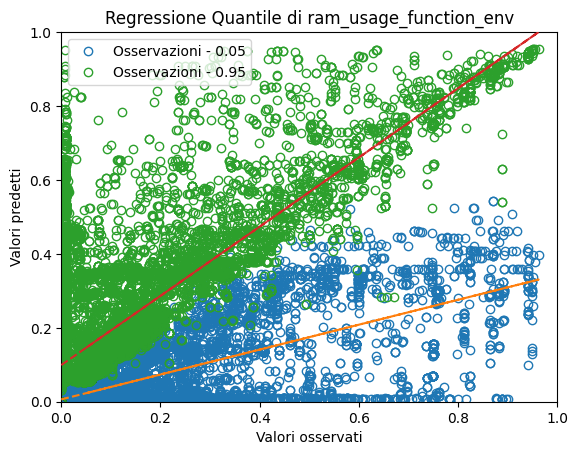

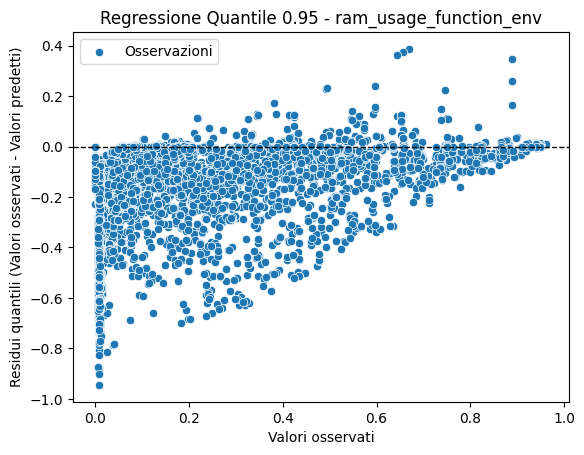

mape: 3.0653237489799705e+22
mse: 828567582715827.9
rmse: 28784849.881766412
R-squared score: 0.1879100866522896
Standard deviation: 36875601.25315443
Quantile loss with library:  1084188.0768669446
------------------------------
Target: power_usage_function_env
mape: 492288911884.95374
mse: 0.0006679247638718751
rmse: 0.025844240439058662
R-squared score: 0.9729843651304847
Standard deviation: 0.154796963857759


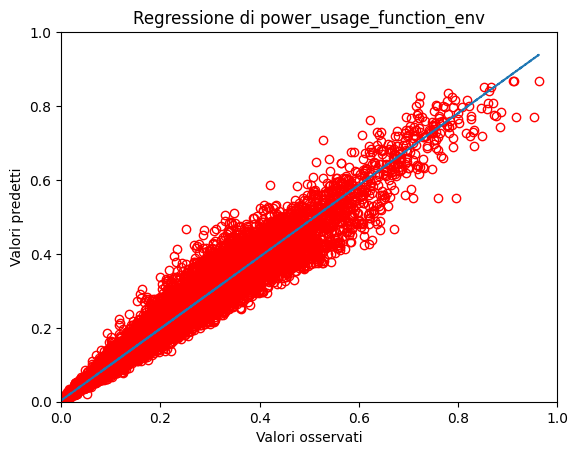

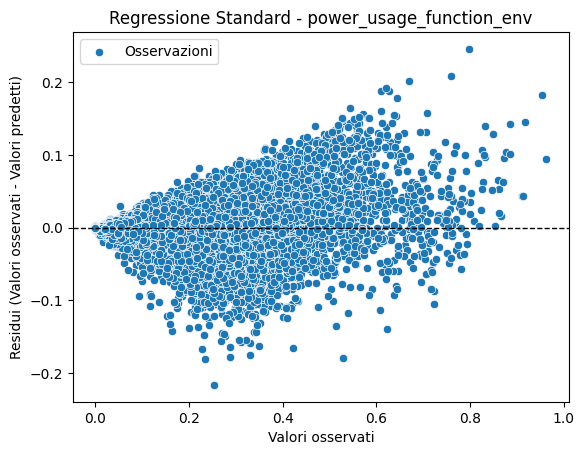

mape: 4.315360246351926e+16
mse: 5132412.458585422
rmse: 2265.4828312272466
R-squared score: 0.9729843651304847
Standard deviation: 13569.36237970672
Quantile loss with library:  576.1162614026928
------------------------------
Target: power_usage_function_env quantiles
Prediction for alpha 0.05 are greater than true values in 3.130061548428895 % of cases and less or equal in 96.8699384515711 % of cases.
mape: 0.12642549309684442
mse: 0.003533505862110861
rmse: 0.05944329955605477
R-squared score: 0.857079854882592
Standard deviation: 0.11430796663262856
Quantile loss with library:  0.0017769061396647509
Prediction for alpha 0.95 are greater than true values in 96.89828312277292 % of cases and less or equal in 3.1017168772270813 % of cases.
mape: 5796158213009.306
mse: 0.0028597818882699906
rmse: 0.05347692856054834
R-squared score: 0.8843300511092066
Standard deviation: 0.18661914927540177
Quantile loss with library:  0.001930403745187339


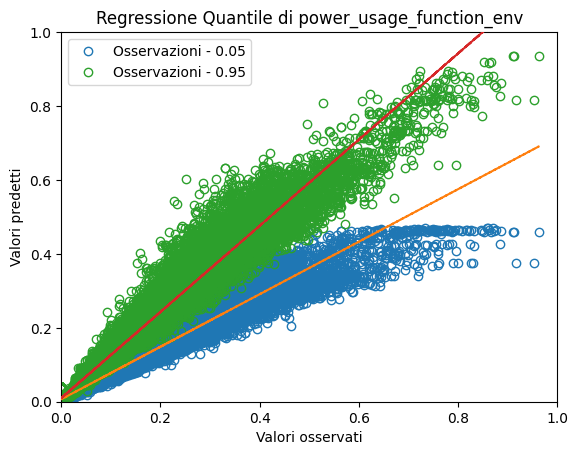

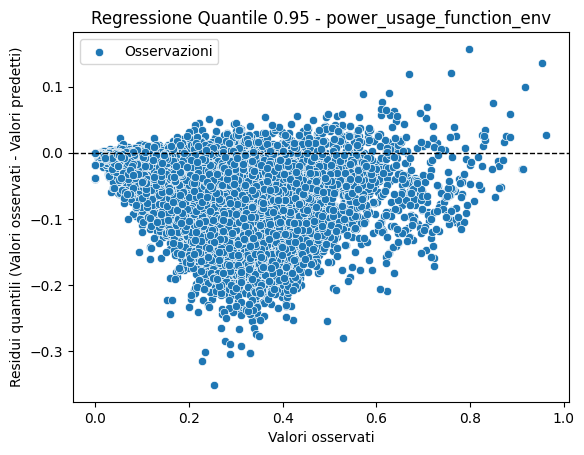

mape: 5.080860066138313e+17
mse: 21974900.447035044
rmse: 4687.739374905034
R-squared score: 0.8843300511092066
Standard deviation: 16358.866481628222
Quantile loss with library:  169.21745300934774
------------------------------
Target: medium_latency_function_env
mape: 100924810535.59998
mse: 0.00012346387964924996
rmse: 0.011111430135191867
R-squared score: 0.866013190445196
Standard deviation: 0.02685225855269147


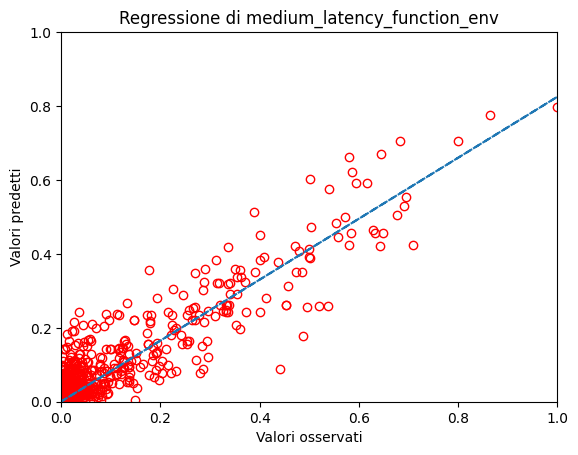

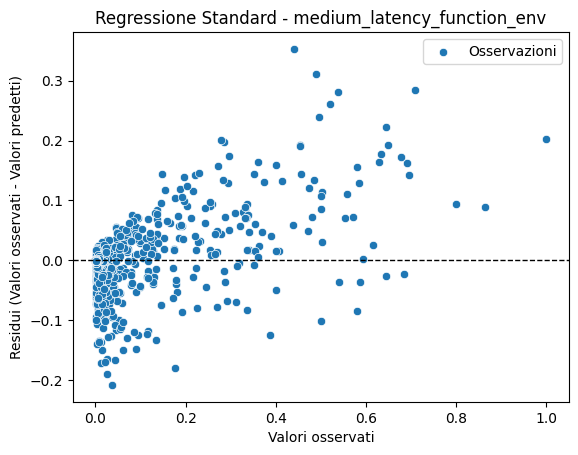

mape: 2.603811401551791e+21
mse: 8.217942211274251e+16
rmse: 286669534.67842114
R-squared score: 0.866013190445196
Standard deviation: 692775310.7122244
Quantile loss with library:  21420252.51764794
------------------------------
Target: medium_latency_function_env quantiles
Prediction for alpha 0.05 are greater than true values in 3.158406219630709 % of cases and less or equal in 96.8415937803693 % of cases.
mape: 0.17766357968625998
mse: 0.0009246257225227496
rmse: 0.03040765894512022
R-squared score: -0.0034323475423148064
Standard deviation: 0.000264259155641082
Quantile loss with library:  0.00015460618675016343
Prediction for alpha 0.95 are greater than true values in 96.89018464528668 % of cases and less or equal in 3.1098153547133136 % of cases.
mape: 36129746047.45234
mse: 0.0005240749050488983
rmse: 0.02289268234718025
R-squared score: 0.4312577517025621
Standard deviation: 0.0416217146115984
Quantile loss with library:  0.000338107030395904


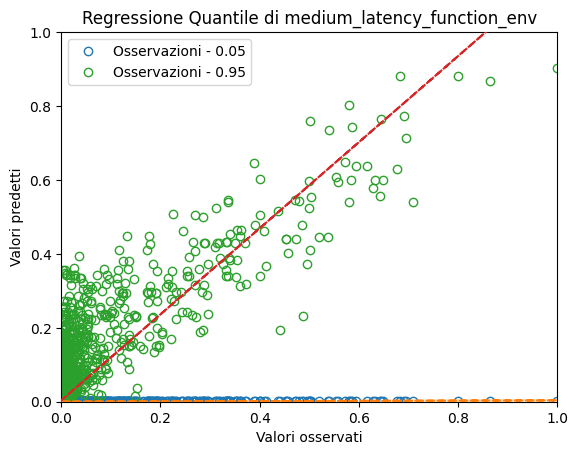

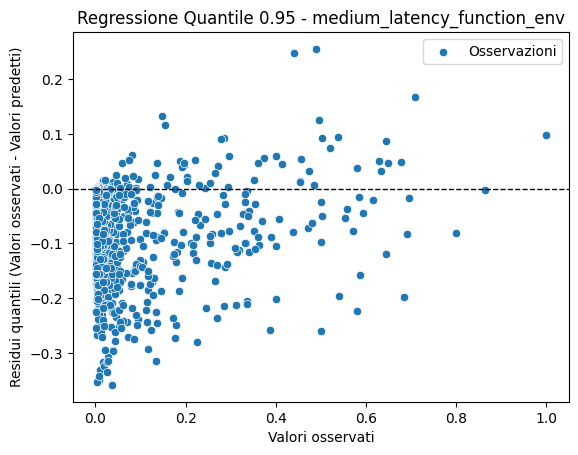

mape: 9.321300103622681e+20
mse: 3.48832168267041e+17
rmse: 590620155.6559352
R-squared score: 0.4312577517025621
Standard deviation: 1073820148.7165203
Quantile loss with library:  8722998.20057528
------------------------------
Target: cpu_usage_function_figlet
mape: 355009771209.41864
mse: 0.00019046571983545382
rmse: 0.013800931846634626
R-squared score: 0.9961414113415076
Standard deviation: 0.22182675455506148


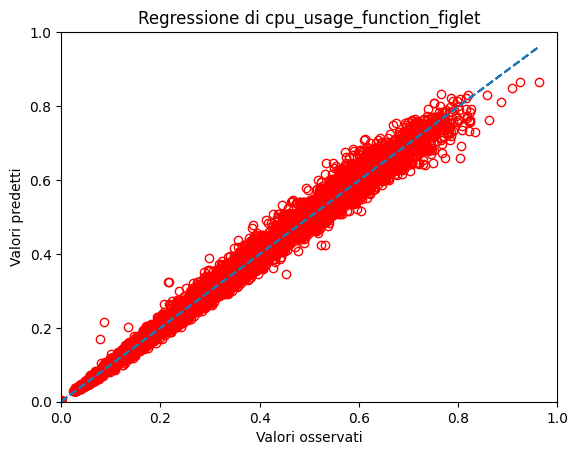

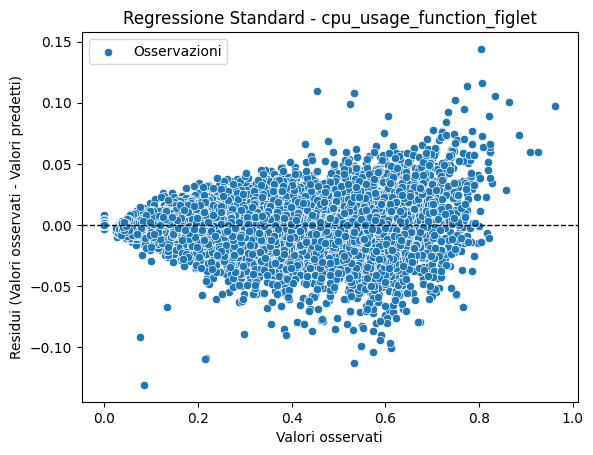

mape: 13984544907480.494
mse: 0.2955513074437869
rmse: 0.5436463073026312
R-squared score: 0.9961414113415076
Standard deviation: 8.738199515432981
Quantile loss with library:  0.14663481990722638
------------------------------
Target: cpu_usage_function_figlet quantiles
Prediction for alpha 0.05 are greater than true values in 2.6684483317136376 % of cases and less or equal in 97.33155166828637 % of cases.
mape: 0.06079719036532547
mse: 0.0020028766048568614
rmse: 0.04475350941386454
R-squared score: 0.9594243155223048
Standard deviation: 0.19231375982115312
Quantile loss with library:  0.001316703326494593
Prediction for alpha 0.95 are greater than true values in 97.00761256883706 % of cases and less or equal in 2.9923874311629413 % of cases.
mape: 1310062530475.3757
mse: 0.000743602883076149
rmse: 0.0272690829159352
R-squared score: 0.9849355692271623
Standard deviation: 0.23742064960151898
Quantile loss with library:  0.0009880071620615215


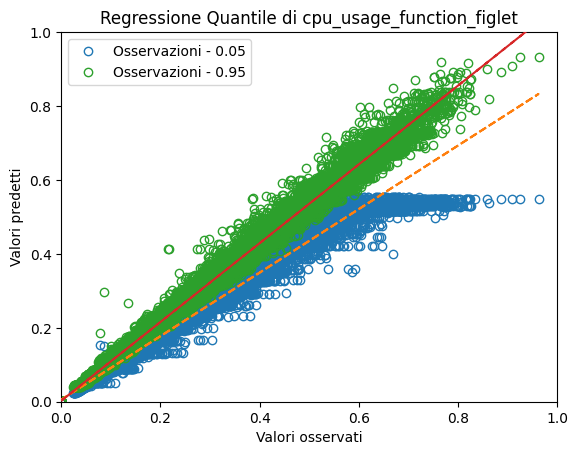

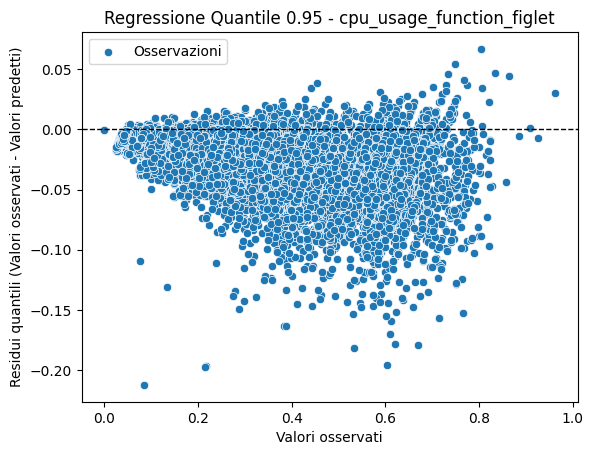

mape: 51605983200483.89
mse: 1.1538706519051838
rmse: 1.0741837142245194
R-squared score: 0.9849355692271623
Standard deviation: 9.352474229103036
Quantile loss with library:  0.038919578127927464
------------------------------
Target: ram_usage_function_figlet
mape: 429076650530.93414
mse: 0.0008993146700865315
rmse: 0.029988575659516268
R-squared score: 0.8051283563291669
Standard deviation: 0.059001627684106286


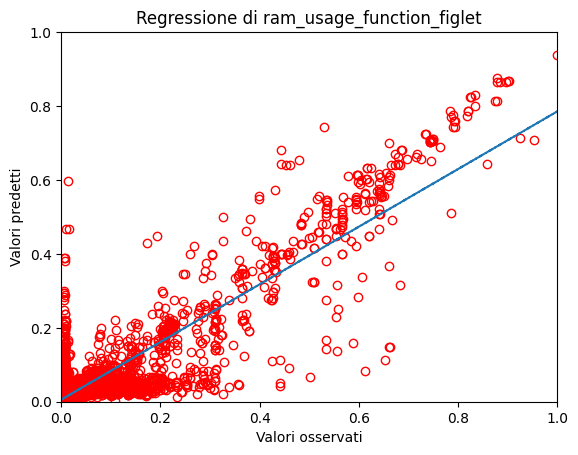

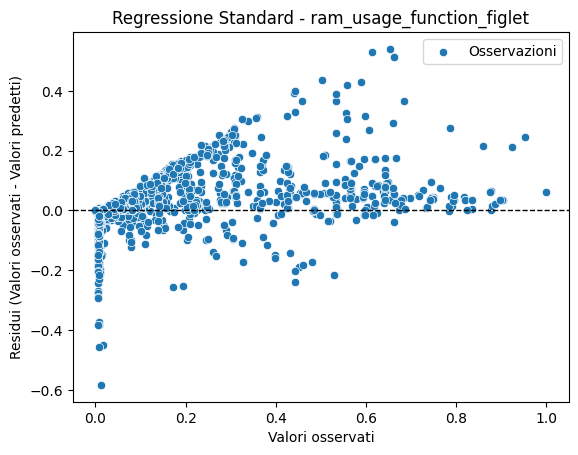

mape: 9.382017886785734e+19
mse: 42996630979253.24
rmse: 6557181.633846453
R-squared score: 0.8051283563291669
Standard deviation: 12901059.183666103
Quantile loss with library:  1373441.8833284725
------------------------------
Target: ram_usage_function_figlet quantiles
Prediction for alpha 0.05 are greater than true values in 3.3770651117589896 % of cases and less or equal in 96.622934888241 % of cases.
mape: 0.22383436390412936
mse: 0.0034591571332955205
rmse: 0.058814599661100475
R-squared score: 0.2504385186820933
Standard deviation: 0.02186430261395208
Quantile loss with library:  0.000881097615993384
Prediction for alpha 0.95 are greater than true values in 97.12099125364432 % of cases and less or equal in 2.879008746355685 % of cases.
mape: 24753913508599.63
mse: 0.004733336413976586
rmse: 0.06879924719047865
R-squared score: -0.025662182236916076
Standard deviation: 0.08698463153326183
Quantile loss with library:  0.002430652080123397


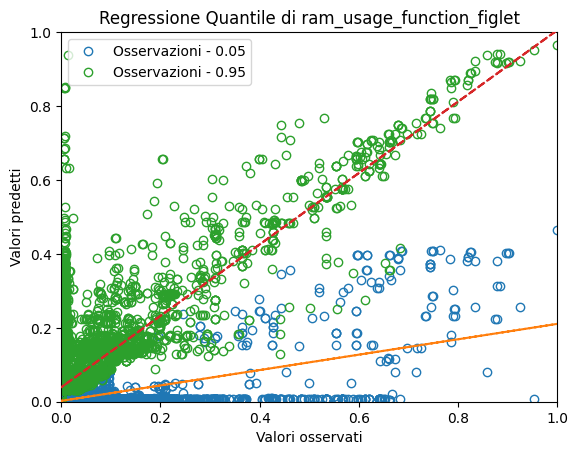

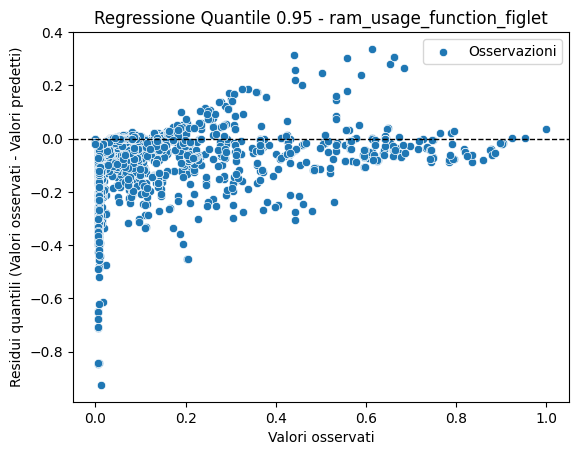

mape: 5.412591410385364e+21
mse: 226302901378035.72
rmse: 15043367.35501848
R-squared score: -0.025662182236916298
Standard deviation: 19019710.532194242
Quantile loss with library:  531476.6316018127
------------------------------
Target: power_usage_function_figlet
mape: 622416710914.3151
mse: 0.0007933063126773027
rmse: 0.028165693896605896
R-squared score: 0.9745083958382306
Standard deviation: 0.17434293859129293


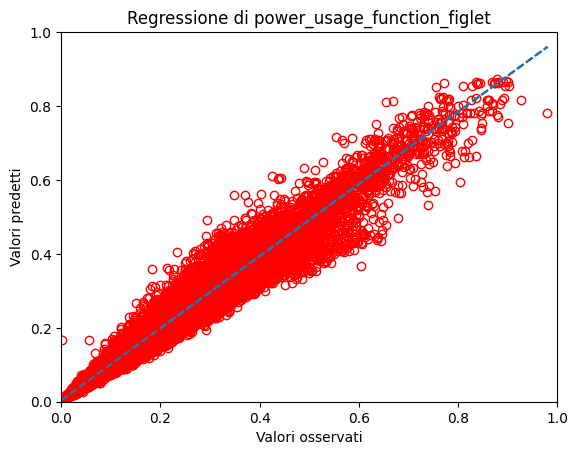

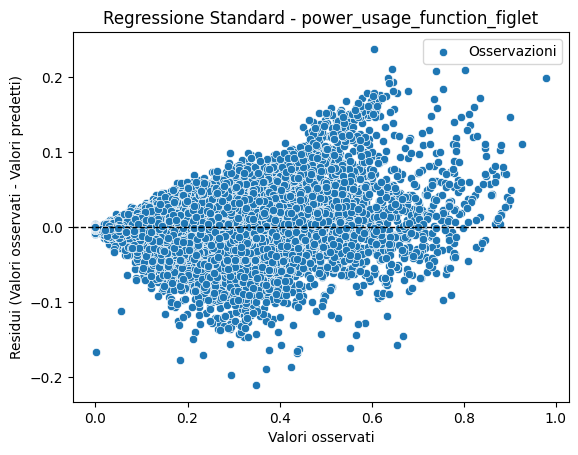

mape: 5.0992224115784744e+16
mse: 5324591.952456385
rmse: 2307.50773616393
R-squared score: 0.9745083958382306
Standard deviation: 14283.25114310215
Quantile loss with library:  596.1977085066032
------------------------------
Target: power_usage_function_figlet quantiles
Prediction for alpha 0.05 are greater than true values in 3.142209264658244 % of cases and less or equal in 96.85779073534175 % of cases.
mape: 0.1296313380576709
mse: 0.0034721763392502277
rmse: 0.058925175767665115
R-squared score: 0.8884272778300294
Standard deviation: 0.1361339921631614
Quantile loss with library:  0.0018998847628649673
Prediction for alpha 0.95 are greater than true values in 96.73226433430516 % of cases and less or equal in 3.2677356656948495 % of cases.
mape: 8177151787533.503
mse: 0.0034921908494519325
rmse: 0.05909476160753957
R-squared score: 0.8877841441962736
Standard deviation: 0.207715276984469
Quantile loss with library:  0.002220829782287095


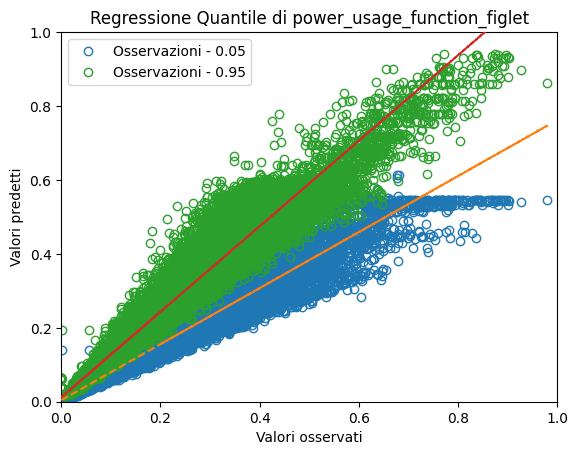

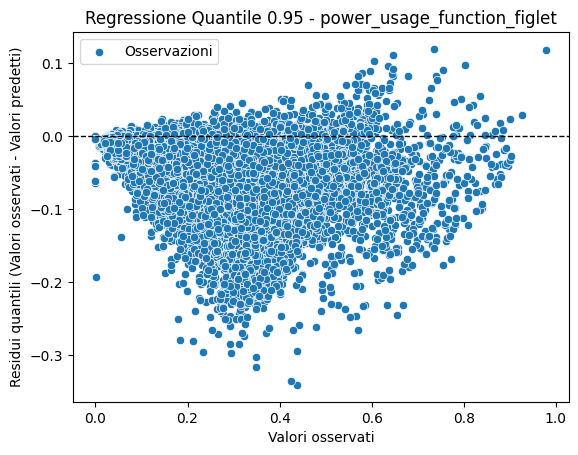

mape: 6.699228174099293e+17
mse: 23439232.735561717
rmse: 4841.408135611138
R-squared score: 0.8877841441962736
Standard deviation: 17017.31937869474
Quantile loss with library:  181.9441027138431
------------------------------
Target: medium_latency_function_figlet
mape: 140628531782.97977
mse: 6.11011566729173e-05
rmse: 0.007816722885769796
R-squared score: 0.9167875220100051
Standard deviation: 0.024378787712709942


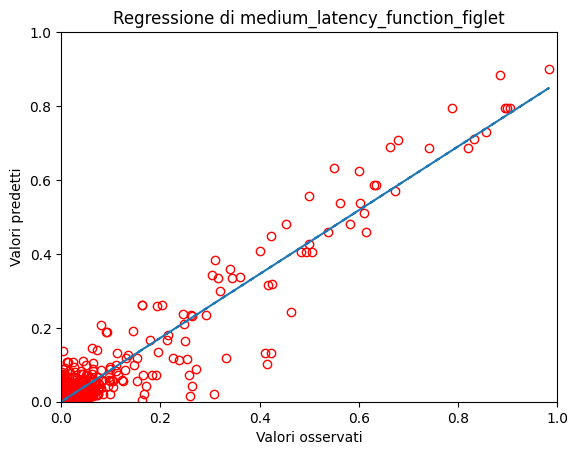

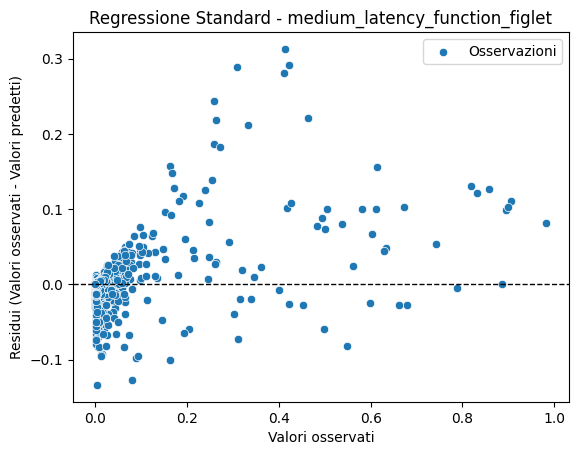

mape: 3.4677612743453437e+21
mse: 3.7153602582727624e+16
rmse: 192752697.9907872
R-squared score: 0.9167875220100051
Standard deviation: 601156926.5074087
Quantile loss with library:  13631795.87611886
------------------------------
Target: medium_latency_function_figlet quantiles
Prediction for alpha 0.05 are greater than true values in 2.9842889536767085 % of cases and less or equal in 97.01571104632329 % of cases.
mape: 0.15629688126559754
mse: 0.0007332734641800884
rmse: 0.02707902258539049
R-squared score: 0.0013691176851566844
Standard deviation: 0.0002649093074593957
Quantile loss with library:  0.00010502895158520275
Prediction for alpha 0.95 are greater than true values in 96.81324910916747 % of cases and less or equal in 3.1867508908325237 % of cases.
mape: 47596128178.3603
mse: 0.0001631081055501304
rmse: 0.012771378373148703
R-squared score: 0.7778662404750193
Standard deviation: 0.031603211456306006
Quantile loss with library:  0.00023038782491136066


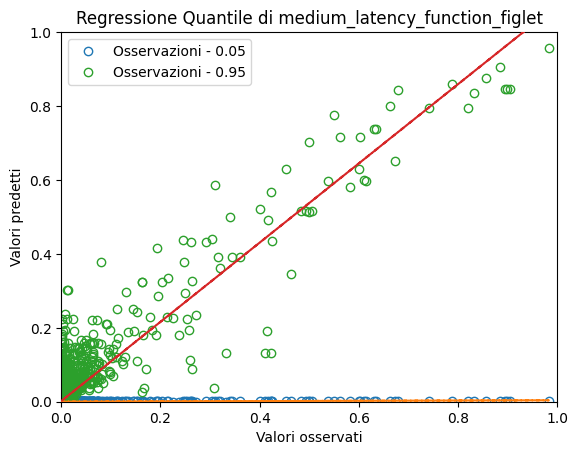

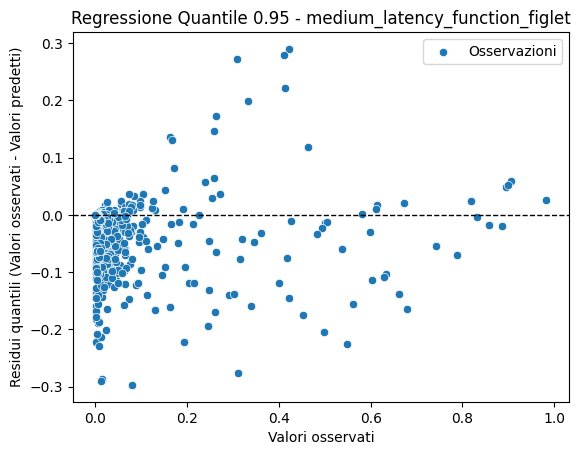

mape: 1.1736737062459526e+21
mse: 9.918067122806557e+16
rmse: 314929629.00950676
R-squared score: 0.7778662404750193
Standard deviation: 779304110.2257819
Quantile loss with library:  5681137.157457328
------------------------------


In [119]:
quantiles_string = [str(q) for q in QUANTILES]
all_metrics = {}
all_metrics_no_scale = {}
for target_name, y_pred in all_predictions.items():
    print(f"Target: {target_name}")

    if target_name.startswith('overloaded'):
        task_type = 'binary classification'
    elif target_name.startswith('replica'):
        task_type = 'classification'
    else:
        task_type = 'regression'

    if target_name.endswith('quantiles'):
        # Get the test dataset for the current iteration
        trunc_target = target_name[0:target_name.index(' ')]
        y_test = y_test_dict[trunc_target]
        y_test_df = pd.DataFrame(y_test, columns=[trunc_target])
        y_pred_df = pd.DataFrame(y_pred, columns=quantiles_string)
        for quantile in QUANTILES:
            statistics = (y_pred_df[str(quantile)] > y_test_df[trunc_target]).value_counts(normalize=True)
            if statistics.size > 1:
                true_percentage, false_percentage = statistics[True], statistics[False]
                print(f"Prediction for alpha {quantile} are greater than true values in {true_percentage * 100} % of cases and less or equal in {false_percentage * 100} % of cases.")
            all_metrics[target_name] = metrics(task_type, y_test_df, y_pred_df[str(quantile)], quantile) 
        plot_quantile_regression(y_test, y_pred_df, trunc_target)
        # metrics on non-scaled predictions
        y_test_df_not_scaled = pd.DataFrame()
        for col in y_test_df:
            y_test_df_not_scaled[col] = [y[0] for y in y_scalers[trunc_target].inverse_transform(pd.DataFrame(y_test_df[col])).tolist()]
        y_pred_df_not_scaled = pd.DataFrame()
        for col in y_pred_df:
            y_pred_df_not_scaled[col] = [y[0] for y in y_scalers[trunc_target].inverse_transform(pd.DataFrame(y_pred_df[col])).tolist()]
        all_metrics_no_scale[target_name] = metrics(task_type, y_test_df_not_scaled, y_pred_df_not_scaled[str(quantile)], quantile) 
    else:
        y_test = y_test_dict[target_name]
        y_test_df = pd.DataFrame(y_test, columns=[target_name])
        y_pred_df = pd.DataFrame(y_pred, columns=[target_name])
        all_metrics[target_name] = metrics(task_type, y_test_df, y_pred_df, 0)
        if task_type == 'regression':
            plot_regression(y_test, y_pred, target_name)
        # metrics on non-scaled predictions
        y_test_df_not_scaled = pd.DataFrame()
        for col in y_test_df:
            y_test_df_not_scaled[col] = [y[0] for y in y_scalers[target_name].inverse_transform(pd.DataFrame(y_test_df[col])).tolist()]
        y_pred_df_not_scaled = pd.DataFrame()
        for col in y_pred_df:
            y_pred_df_not_scaled[col] = [y[0] for y in y_scalers[target_name].inverse_transform(pd.DataFrame(y_pred_df[col])).tolist()]
        all_metrics_no_scale[target_name] = metrics(task_type, y_test_df_not_scaled, y_pred_df_not_scaled, quantile) 
    
    print("-" * 30)


In [120]:
pd.DataFrame(all_metrics).transpose()

,mape,mse,rmse,r2,quantile_loss,std_dev
cpu_usage_function_shasum,453561811424.483887,0.000211,0.014519,0.993927,Not calculated for this target,0.185548
cpu_usage_function_shasum quantiles,628970836149.113892,0.000764,0.027645,0.977981,0.001102,0.1988
ram_usage_function_shasum,1497132067253.150391,0.002051,0.045292,0.851392,Not calculated for this target,0.105457
ram_usage_function_shasum quantiles,7597576424126.129883,0.006737,0.082078,0.511974,0.002813,0.136301
power_usage_function_shasum,654264776985.924805,0.000883,0.029717,0.96722,Not calculated for this target,0.16061
power_usage_function_shasum quantiles,2057555492658.56665,0.003681,0.060674,0.863353,0.002388,0.194292
medium_latency_function_shasum,146987834676.460541,0.000207,0.014379,0.832987,Not calculated for this target,0.03
medium_latency_function_shasum quantiles,31040778230.37133,0.000573,0.023945,0.536834,0.00052,0.044222
cpu_usage_function_curl,218710498449.590973,0.000219,0.014797,0.994545,Not calculated for this target,0.199818
cpu_usage_function_curl quantiles,536199156826.412781,0.000982,0.031344,0.97552,0.000878,0.219839


In [121]:
pd.DataFrame(all_metrics_no_scale).transpose()

,mape,mse,rmse,r2,quantile_loss,std_dev
cpu_usage_function_shasum,1.463825e+13,2.195716e-01,4.685847e-01,0.993927,1.357538e-01,5.988362e+00
cpu_usage_function_shasum quantiles,2.029940e+13,7.960699e-01,8.922275e-01,0.977981,3.557927e-02,6.416072e+00
ram_usage_function_shasum,3.667489e+20,1.231023e+14,1.109515e+07,0.851392,2.722089e+06,2.583347e+07
ram_usage_function_shasum quantiles,1.861160e+21,4.042653e+14,2.010635e+07,0.511974,6.891076e+05,3.338946e+07
power_usage_function_shasum,5.404607e+16,6.026155e+06,2.454823e+03,0.967220,7.139369e+02,1.326732e+04
power_usage_function_shasum quantiles,1.699660e+17,2.512060e+07,5.012045e+03,0.863353,1.972957e+02,1.604968e+04
medium_latency_function_shasum,3.554321e+21,1.208877e+17,3.476891e+08,0.832987,3.007736e+07,7.254387e+08
medium_latency_function_shasum quantiles,7.505989e+20,3.352510e+17,5.790086e+08,0.536834,1.257983e+07,1.069326e+09
cpu_usage_function_curl,2.828627e+13,3.662116e+00,1.913666e+00,0.994545,4.185684e-01,2.584292e+01
cpu_usage_function_curl quantiles,6.934771e+13,1.643290e+01,4.053751e+00,0.975520,1.136082e-01,2.843219e+01
